# **Análisis de características influyentes en los precios de alojamientos de Airbnb en la ciudad de Washington D.C usando modelos de regresión.** <br>

Este trabajo se enfocará en hacer un análisis de las características que influyen en el precio de los alojamientos de Airbnb en la ciudad de Washington D.C en Estados Unidos usando modelos de regresión en Python.

El desarrollo estará conformado de la siguiente forma:
- Carga de librerías
- Carga de datos
- Preprocesado y limpieza de los datos 
- Transformación de los datos
- Estudio de correlación
- Revisión de outliers
- Análisis de los datos
- Selección de características 
- Modelos de regresión    
- Análisis de los resultados de los modelos de regresión

# **Carga de librerias**

In [1]:
# https://pysal.org/libpysal/tutorial.html
#import libpysal as lps

# Importar Módulos a utilizar
import io
from io import BytesIO
import gzip
import timeit

# Librerías para gráficar
import seaborn as sns
import matplotlib.pyplot as plt
import contextily as ctx
import dexplot as dxp

# Librerías para obtener datos
import requests
from urllib.request import Request, urlopen

# Librerías para manejo de datos
import pandas as pd
import numpy as np
from kmodes.kmodes import KModes
from statsmodels.stats.outliers_influence import variance_inflation_factor

#from sklearn.decomposition import PCA
#from sklearn.cluster import KMeans

# Librerías para normalización de datos
#from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler

# Librerías para datos espaciales
import geopandas as gpd
from pyproj import Geod
from shapely.geometry import Point, LineString
from shapely.ops import nearest_points
import shapely.wkt
import shapely.geometry

# Librerías para mapas interactivos, Mediante Folium podemos manipular los datos en Python y visualizar los resultados en Leaflet.
import folium
from folium.plugins import FastMarkerCluster
import geopandas as gpd
from branca.colormap import LinearColormap

# Librerías para regresión cuantílica
import statsmodels.api as sm
import statsmodels.formula.api as smf
from statsmodels.regression.quantile_regression import QuantReg
from statsmodels.regression.quantile_regression import QuantReg

# Configuración para mostrar la salida sin que se recorten los datos
pd.options.display.max_rows = 4000
pd.options.display.max_columns = 500
pd.options.display.width = 4000

# Configuración para no mostrar warnings
import warnings
warnings.filterwarnings("ignore")

# Configuración para gráficas
plt.rcParams.update({'font.size': 10})
plt.rcParams['figure.figsize'] = [8, 8]

# semilla
np.random.seed(12345)

# **Carga de datos**

Obtener datos de los diferentes alojamientos que posee Airbnb en la ciudad de Washington D.C, en este caso los datos provienen de la página Inside Airbnb. <br>
http://insideairbnb.com/washington-dc

In [2]:
# obtenemos los datos desde la fuente
url_inside_airbnb = "http://data.insideairbnb.com/united-states/dc/washington-dc/2022-09-14/data/listings.csv.gz"
req = Request(url_inside_airbnb)
req.add_header('Accept-Encoding', 'gzip')
response = urlopen(req)

# los datos vienen en formato gzip, por lo tanto hay que descomprimir el archivo y cargar los datos a un dataframe de pandas
content = gzip.decompress(response.read())
alojamientos = pd.read_csv(io.StringIO(content.decode('utf-8')))

# creamos una estructura de geopandas para datos espaciales, con una columna geometry que contiene las coordenadas 
# coordinate reference system (CRS)
alojamientos_gdf = gpd.GeoDataFrame(alojamientos, geometry=gpd.points_from_xy(alojamientos.longitude, alojamientos.latitude), crs='EPSG:4326')

In [3]:
alojamientos_gdf.shape

(6473, 76)

In [4]:
#xol = ['availability_365','accommodates', 'bedrooms', 'beds', "price",  'property_type', 'room_type']
#alojamientos_gdf[alojamientos_gdf['accommodates'] == 0][xol]
#alojamientos_gdf['accommodates'].isnull().sum()

Se obtienen los datos geográficos de los barrios de la ciudad de Washington DC. <br>
http://insideairbnb.com/get-the-data/

In [5]:
# obtenemos los datos desde la fuente
url_vecindarios_airbnb = "http://data.insideairbnb.com/united-states/dc/washington-dc/2022-09-14/visualisations/neighbourhoods.geojson"
vecindarios_airbnb = gpd.read_file(url_vecindarios_airbnb)

In [6]:
vecindarios_airbnb.shape

(39, 3)

WARDS <br>
https://opendata.dc.gov/datasets/DCGIS::wards-from-2022/about

In [7]:
# obtenemos los datos desde la fuente
url_wards = "https://opendata.arcgis.com/api/v3/datasets/c5cd8b40fb784548a6680aead5f919ed_53/downloads/data?format=geojson&spatialRefId=4326&where=1%3D1"
wards = gpd.read_file(url_wards)



<AxesSubplot: >

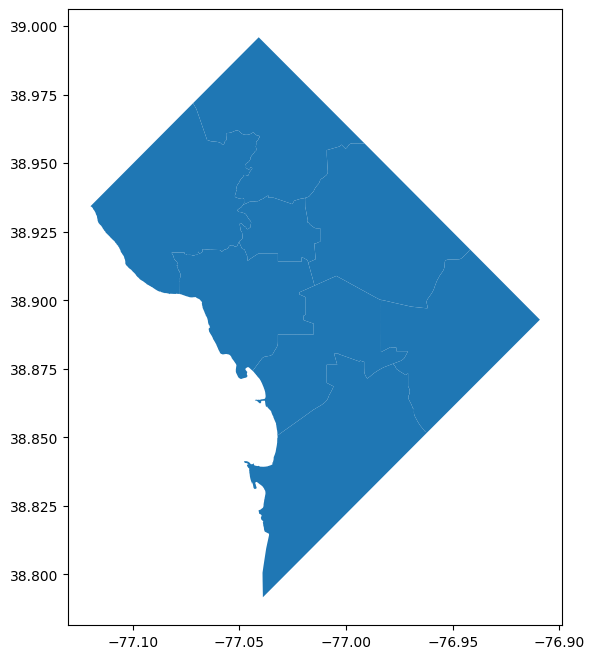

In [8]:
wards.plot()

Se obtienen los datos de incidentes de crimenes en el 2020 en la ciudad de Washington DC. <br>
https://opendata.dc.gov/datasets/crime-incidents-in-2020/explore?location=38.913236%2C-77.030441%2C16.00

In [9]:
# obtenemos los datos desde la fuente
url_crime_incidents = "https://opendata.arcgis.com/api/v3/datasets/f516e0dd7b614b088ad781b0c4002331_2/downloads/data?format=geojson&spatialRefId=4326&where=1%3D1"
crime_incidents = gpd.read_file(url_crime_incidents)

In [10]:
crime_incidents.shape

(27912, 24)

Se obtienen los principales puntos de interés de la ciudad de Washington DC. <br>
https://opendata.dc.gov/datasets/points-of-interest/explore?location=38.890773%2C-77.033733%2C13.83 <br>

Aqui se encuentra información de sitios históricos, nombres de edificaciones, estationes de metro, circulos de tráfico, edificios federales, sitios culturales y embajadas.

In [11]:
# obtenemos los datos desde la fuente
url_point_of_interest = "https://opendata.arcgis.com/api/v3/datasets/f323f677b3f34fe08956b8fcce3ace44_3/downloads/data?format=geojson&spatialRefId=4326&where=1%3D1"
point_of_interest = gpd.read_file(url_point_of_interest)

In [12]:
point_of_interest.shape

(14692, 55)

De los puntos de interés se trabajará puntualmente con algunos de los más conocidos como:
- La casa blanca
- Monumento a Lincoln
- Monumento a Washington
- Museo Nacional del Aire y el Espacio de Estados Unidos
- Zoologico Nacional

<br>
Estos sitios tendrán su propia columna en el dataset.

In [13]:
CASA_BLANCA = point_of_interest[ point_of_interest["ALIASNAME"] == "WHITE HOUSE" ]
LINCOLN_MEMORIAL = point_of_interest[ point_of_interest["ALIASNAME"] == "LINCOLN MEMORIAL" ]
WASHINGTON_MONUMENT = point_of_interest[ point_of_interest["ALIASNAME"] == "WASHINGTON MONUMENT" ]
NATIONAL_AIR_AND_SPACE_MUSEUM = point_of_interest[ point_of_interest["ALIASNAME"] == "NATIONAL AIR AND SPACE MUSEUM" ]
NATIONAL_ZOOLOGICAL_PARK = point_of_interest[ point_of_interest["ALIASNAME"] == "NATIONAL ZOO ADMINISTRATION" ]

Se obtienen datos geográficos de los sitios para recreación.
<br>
https://opendata.dc.gov/datasets/DCGIS::recreation-facilities-1/explore

In [14]:
# obtenemos los datos desde la fuente
url_recreation_facilities = "https://opendata.arcgis.com/api/v3/datasets/7122c1c815314588abe5c1864da8a355_3/downloads/data?format=geojson&spatialRefId=4326&where=1%3D1"
recreation_facilities = gpd.read_file(url_recreation_facilities)

In [15]:
recreation_facilities.shape

(139, 22)

Se obtienen datos geográficos de localización de bancos. <br>
https://opendata.dc.gov/maps/bank-locations

In [16]:
# obtenemos los datos desde la fuente
url_bank_location = "https://opendata.arcgis.com/api/v3/datasets/dfc51a5bd29347d0a2399743d3144d31_0/downloads/data?format=geojson&spatialRefId=4326&where=1%3D1"
bank_location = gpd.read_file(url_bank_location)

In [17]:
bank_location.shape

(210, 17)

Se obtienen datos geográficos de paradas de bus del metro.
<br>
https://opendata.dc.gov/datasets/metro-bus-stops-2/explore?location=38.892509%2C-77.020630%2C12.69

In [18]:
# obtenemos los datos desde la fuente
url_metro_bus_stop = "https://opendata.arcgis.com/api/v3/datasets/a29b9dbb2f00459db2b0c3c56faca297_53/downloads/data?format=geojson&spatialRefId=4326&where=1%3D1"
metro_bus_stop = gpd.read_file(url_metro_bus_stop)

In [19]:
metro_bus_stop.shape

(10363, 76)

# **Limpieza y transformación de datos**

Revisión del dataset

In [20]:
alojamientos_gdf.head(4)

,id,listing_url,scrape_id,last_scraped,source,name,description,neighborhood_overview,picture_url,host_id,host_url,host_name,host_since,host_location,host_about,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_thumbnail_url,host_picture_url,host_neighbourhood,host_listings_count,host_total_listings_count,host_verifications,host_has_profile_pic,host_identity_verified,neighbourhood,neighbourhood_cleansed,neighbourhood_group_cleansed,latitude,longitude,property_type,room_type,accommodates,bathrooms,bathrooms_text,bedrooms,beds,amenities,price,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,calendar_updated,has_availability,availability_30,availability_60,availability_90,availability_365,calendar_last_scraped,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month,geometry
0,3686,https://www.airbnb.com/rooms/3686,20220914194735,2022-09-14,city scrape,Vita's Hideaway,IMPORTANT NOTES<br />* Carefully read and be s...,We love that our neighborhood is up and coming...,https://a0.muscache.com/pictures/61e02c7e-3d66...,4645,https://www.airbnb.com/users/show/4645,Vita,2008-11-26,"Washington, DC","I am a literary scholar, teacher, poet, vegan ...",within a day,100%,100%,f,https://a0.muscache.com/im/users/4645/profile_...,https://a0.muscache.com/im/users/4645/profile_...,Anacostia,1.0,4.0,"['email', 'phone', 'work_email']",t,t,"Washington, District of Columbia, United States",Historic Anacostia,NaN,38.86339,-76.98889,Private room in home,Private room,1,NaN,1 private bath,1.0,1.0,"[""Dryer"", ""Smoke alarm"", ""Cooking basics"", ""In...",$67.00,31,365,31.0,31.0,365.0,365.0,31.0,365.0,NaN,t,0,1,31,306,2022-09-14,81,5,0,2010-11-01,2022-07-06,4.63,4.72,4.43,4.90,4.83,3.86,4.62,NaN,f,1,0,1,0,0.56,POINT (-76.98889 38.86339)
1,841260,https://www.airbnb.com/rooms/841260,20220914194735,2022-09-15,city scrape,Metro Style Living in Washington DC,Metro Style Living in Washington DC<br /><br /...,Its a very safe neighborhood and the house is ...,https://a0.muscache.com/pictures/4261fe6f-4828...,315148,https://www.airbnb.com/users/show/315148,John,2010-12-10,"Washington, DC","My name is John and I am from Washington DC, I...",within a few hours,81%,48%,f,https://a0.muscache.com/im/pictures/user/47fcf...,https://a0.muscache.com/im/pictures/user/47fcf...,Bloomingdale,71.0,79.0,"['email', 'phone']",t,t,"Washington, District of Columbia, United States","Brightwood Park, Crestwood, Petworth",NaN,38.93719,-77.02335,Private room in rental unit,Private room,1,NaN,2 shared baths,1.0,1.0,"[""Smoke alarm"", ""Cooking basics"", ""Bed linens""...",$39.00,31,360,31.0,31.0,360.0,360.0,31.0,360.0,NaN,t,0,0,0,46,2022-09-15,14,0,0,2013-06-10,2021-04-24,4.43,4.36,3.93,4.86,4.86,4.57,4.29,NaN,f,46,0,46,0,0.12,POINT (-77.02335 38.93719)
2,3943,https://www.airbnb.com/rooms/3943,20220914194735,2022-09-15,city scrape,Historic Rowhouse Near Monuments,You will be enjoying the en-suite style space ...,This rowhouse is centrally located in the hear...,https://a0.muscache.com/pictures/6d12fcf6-1f03...,5059,https://www.airbnb.com/users/show/5059,Vasa,2008-12-12,"Washington, DC",I have been living and working in DC for the l...,within an hour,100%,76%,t,https://a0.muscache.com/im/pictures/user/8ec69...,https://a0.muscache.com/im/pictures/user/8ec69...,Eckington,4.0,4.0,"['email', 'phone']",t,t,"Washington, District of Columbia, United States","Edgewood, Bloomingdale, Truxton Circle, Eckington",NaN,38.91195,-77.00456,Private room in townhous

Forma de los datos

In [21]:
alojamientos_gdf.shape

(6473, 76)

Revisión de duplicados en todos los datasets

In [22]:
print(alojamientos_gdf.duplicated().sum())
print(vecindarios_airbnb.duplicated().sum())
print(recreation_facilities.duplicated().sum())
print(bank_location.duplicated().sum())
print(point_of_interest.duplicated().sum())
print(metro_bus_stop.duplicated().sum())
print(crime_incidents.duplicated().sum())

0
0
0
0
0
0
0


Revisión de nulos o vacios en el dataset de los alojamientos

In [23]:
# Porcentaje de nulos por cada columna
for column in alojamientos_gdf.columns:
    percentage = alojamientos_gdf[column].isnull().mean()
    if percentage > 0:
        print(f'{column}: {round(percentage*100, 2)}%')

description: 1.0%
neighborhood_overview: 31.53%
host_name: 2.49%
host_since: 2.49%
host_location: 15.5%
host_about: 37.14%
host_response_time: 23.0%
host_response_rate: 23.0%
host_acceptance_rate: 15.87%
host_is_superhost: 0.08%
host_thumbnail_url: 2.49%
host_picture_url: 2.49%
host_neighbourhood: 10.51%
host_listings_count: 2.49%
host_total_listings_count: 2.49%
host_has_profile_pic: 2.49%
host_identity_verified: 2.49%
neighbourhood: 31.53%
neighbourhood_group_cleansed: 100.0%
bathrooms: 100.0%
bathrooms_text: 0.11%
bedrooms: 9.78%
beds: 2.27%
minimum_minimum_nights: 0.02%
maximum_minimum_nights: 0.02%
minimum_maximum_nights: 0.02%
maximum_maximum_nights: 0.02%
minimum_nights_avg_ntm: 0.02%
maximum_nights_avg_ntm: 0.02%
calendar_updated: 100.0%
first_review: 18.2%
last_review: 18.2%
review_scores_rating: 18.2%
review_scores_accuracy: 18.57%
review_scores_cleanliness: 18.57%
review_scores_checkin: 18.57%
review_scores_communication: 18.57%
review_scores_location: 18.57%
review_scores_v

In [24]:
#alojamientos_gdf = alojamientos_gdf.dropna(subset=['host_is_superhost','neighbourhood_cleansed', 'property_type', 'room_type', 'latitude', 'longitude', 'accommodates', 'bathrooms_text', 'bedrooms', 'beds', 'amenities', 'price', 'instant_bookable']) 
#alojamientos_gdf.count()

Borrado de características que no son relevantes para el analisis, en todos los datasets.

In [25]:
alojamientos_gdf.drop([
            'listing_url', 'picture_url', 'name', 'host_url',
            'description', 
            'neighbourhood',             
            'scrape_id', 'last_scraped', 'source', 
            'host_total_listings_count',
            'host_listings_count', 
            'neighbourhood_group_cleansed', 'bathrooms', 
            'minimum_minimum_nights', 'maximum_minimum_nights', 
            'minimum_maximum_nights', 'maximum_maximum_nights', 'minimum_nights_avg_ntm','maximum_nights_avg_ntm',
            'calendar_updated','calendar_last_scraped',
            'license',            
            'last_review',
            'first_review',
            'host_since'
], axis=1, inplace=True)

recreation_facilities.drop(["CREATED","EDITED", "GLOBALID", 'USE_TYPE', 'WARD_ID', 'SCHOOL_SITE', 'POOL', 'POOL_NAME', 'WEB_URL', 'PHONE', 'STATUS', 'XCOORD', 'YCOORD', 'FITNESS_CENTER', 'MAR_ID', 'GIS_ID', 'OBJECTID', 'CREATOR', 'EDITOR'], axis = 1, inplace = True)
bank_location.drop(['ZIPCODE', 'WARD', 'LATITUDE', 'LONGITUDE', 'OBJECTID', 'XCOORD', 'YCOORD', 'MAR_ID', 'GIS_ID', 'SE_ANNO_CAD_DATA', 'CREATOR', 'CREATED', 'EDITOR', 'EDITED'], axis = 1, inplace = True)
point_of_interest.drop(['OBJECTID', 'ADDRALIAS_ID', 'ADDRESS_ID', 'STATUS', 'ADDRNUM', 'ADDRNUMSUFFIX', 'STNAME', 'METADATA_ID', 'SITE_ADDRESS_PK', 'ROADWAYSEGID', 'SSL', 'TYPE_', 'ENTRANCETYPE', 'STREET_TYPE', 'QUADRANT', 'CITY', 'STATE', 'SQUARE', 'SUFFIX', 'LOT', 'NATIONALGRID', 'ZIPCODE4', 'XCOORD', 'YCOORD', 'STATUS_ID', 'ASSESSMENT_NBHD', 'ASSESSMENT_SUBNBHD', 'CFSA_NAME', 'HOTSPOT', 'CLUSTER_', 'POLDIST', 'ROC', 'PSA', 'SMD', 'CENSUS_TRACT', 'VOTE_PRCNCT', 'WARD', 'ZIPCODE', 'ANC', 'NEWCOMMSELECT06', 'NEWCOMMCANDIDATE', 'FOCUS_IMPROVEMENT_AREA', 'SE_ANNO_CAD_DATA', 'WARD_2002', 'WARD_2012', 'ANC_2002', 'ANC_2012', 'SMD_2002', 'SMD_2012', 'ANC_2023', 'SMD_2023'], axis = 1, inplace = True)
metro_bus_stop.drop(['EGIS_ID', 'REG_ID', 'BSTP_GEO_ID', 'BSTP_OPS_TCD', 'BSTP_EFF_DATE', 'BSTP_TCD', 'BSTP_HDG', 'BSTP_POS_TCD', 'BSTP_LDC', 'BSTP_MSG_TEXT', 'BSTP_LON', 'BSTP_LAT', 'BSTP_LAT_LON_TCD', 'BSTP_INV_SYR_TCD', 'BSTP_INV_SRV_DATE', 'BSTP_BNH_CNT', 'BSTP_BST_TCD', 'BSTP_IFC_OWN', 'BSTP_HAS_BKRS', 'BSTP_HAS_PRS', 'BSTP_HAS_PVM', 'BSTP_HAS_PRM', 'BSTP_PDP_SIZE_TCD', 'BSTP_PDP_MTR_TCD', 'BSTP_PDP_OBS_TCD', 'BSTP_PDP_HAS_CCN', 'BSTP_HAS_BDR_PDP', 'BSTP_BDR_PDP_OBS', 'BSTP_SWK_WDT', 'BSTP_SWK_HAS_CCN', 'BSTP_SWK_HAS_PPC', 'BSTP_SWK_SLP_WVL', 'BSTP_SWK_OBS_TCD', 'BSTP_SWK_IPD_TCD', 'ONS_CRP_SLP', 'ONS_CRP', 'OFS_CRP', 'AT_STR_ABS_CRP', 'AT_STR_OSS_CRP', 'ONS_CWK', 'OFS_CWK', 'AT_STR_ABS_CWK', 'AT_STR_OSS_CWK', 'ON_STR_STS_OR_TFL', 'ON_STR_PDC_SGL', 'AT_STR_PDC_SGL', 'BSTP_PRK_RST_TCD', 'BSTP_NPK_ZNE_LTH', 'CNF_NPK_SNS', 'STR_LGT_WTN_30_FT', 'BSTP_HAS_LED_DSP', 'BSTP_ACC_RATING', 'BSTP_BRDG_STP', 'BSTP_HAS_LUM_SIGN', 'BSTP_HAS_PWR_SRC', 'METRO_ACCS_STP', 'WARD_ID', 'ANC_ID', 'SMD_ID', 'ROUTEID', 'MEASURE', 'OFFSET', 'BLOCKKEY', 'BLOCKFACEKEY', 'GIS_ID', 'SE_ANNO_CAD_DATA', 'GLOBALID', 'CREATOR', 'CREATED', 'EDITOR', 'EDITED', 'OBJECTID', 'SNOWPRIORITY'], axis = 1, inplace = True)
crime_incidents.drop(['CCN', 'REPORT_DAT', 'BLOCK', 'XBLOCK', 'YBLOCK', 'WARD', 'ANC', 'DISTRICT', 'PSA', 'NEIGHBORHOOD_CLUSTER', 'BLOCK_GROUP', 'CENSUS_TRACT', 'VOTING_PRECINCT', 'LATITUDE', 'LONGITUDE', 'BID', 'START_DATE', 'END_DATE', 'OBJECTID', 'OCTO_RECORD_ID'], axis = 1, inplace = True)

**Transformación de datos**

Hay nulos, asi que se hará limpieza de los datos:

Convertir el tipo de datos de la característica precio de texto a número flotante, además se eliminará el caracter $ del precio.

In [26]:
#alojamientos_gdf[alojamientos_gdf['price'] == 0]

In [27]:
# Eliminamos el caracter $ del precio
alojamientos_gdf['price'] = alojamientos_gdf['price'].str.replace('$','').str.replace(',','')

# Convertimos a entero
alojamientos_gdf['price'] = alojamientos_gdf['price'].astype(float) #.astype(int)

# Eliminar registros donde el precio sea 0
alojamientos_gdf.drop(alojamientos_gdf[alojamientos_gdf['price'] == 0].index, inplace = True)

# Rellenar con el promedio
alojamientos_gdf["price"].fillna(alojamientos_gdf["price"].mean(), inplace = True)

# Rellenamos los 0 con el promedio
#alojamientos_gdf["price"] = np.where(alojamientos_gdf['price'] <= 0, alojamientos_gdf["price"].mean(), alojamientos_gdf['price'])

# mostramos solo 1 decimal
alojamientos_gdf["price"] = round(alojamientos_gdf.price, 2)

# Se creará una nueva columna con el precio a logaritmo para suavizar los datos y hacer una distribución normal.
alojamientos_gdf.loc[:,"log_price"] = np.log(alojamientos_gdf.loc[:,"price"])

Rellenar con el promedio los missing values de las columnas de review scores 

In [28]:
# Lista de características a rellenar con el promedio
review_scores_columns = ['reviews_per_month', 'review_scores_rating', 'review_scores_accuracy', 'review_scores_cleanliness','review_scores_checkin', 'review_scores_communication', 'review_scores_location','review_scores_value']

# Recorrer cada columna para ir aplicando el relleno de los valores vacíos
for column in review_scores_columns:
    alojamientos_gdf[column].fillna(alojamientos_gdf[column].mean(), inplace = True)

- Se considerará que un host no tiene imagen de perfil si el campo host_has_profile_pic está nulo
- Se considerará que un host no tiene la identidad verificada si el campo host_identity_verified está nulo
- Se considerará que un host no es superhost si el campo host_is_superhost está nulo

In [29]:
alojamientos_gdf.fillna({'host_has_profile_pic':0}, inplace=True)
alojamientos_gdf.fillna({'host_identity_verified':0}, inplace=True)
alojamientos_gdf.fillna({'host_is_superhost':0}, inplace=True)
#alojamientos_gdf.fillna({'bathrooms_text':'0 Baths'}, inplace=True)
#alojamientos_gdf.fillna({'bedrooms':0}, inplace=True)
#alojamientos_gdf.fillna({'beds':0}, inplace=True)
#alojamientos_gdf.dropna(subset=['bedrooms', 'beds'])

Rellenamos las camas y habitaciones con el promedio

In [30]:
# Lista de características a rellenar con el promedio
review_scores_columns = ['bedrooms', 'beds']

# Recorrer cada columna para ir aplicando el relleno de los valores vacíos
for column in review_scores_columns:
    alojamientos_gdf[column].fillna(alojamientos_gdf[column].mean(), inplace = True)
    #alojamientos_gdf[column] = round(alojamientos_gdf[column], 0)
    alojamientos_gdf[column] = alojamientos_gdf[column].astype(int)

In [31]:
print(alojamientos_gdf['bedrooms'].value_counts())
print(alojamientos_gdf['beds'].value_counts())

1     4363
2     1291
3      505
4      216
5       60
6       25
7        6
9        2
8        1
15       1
Name: bedrooms, dtype: int64
1     3142
2     1875
3      771
4      330
5      158
6      112
7       30
8       27
9        8
10       8
12       5
11       2
20       1
16       1
Name: beds, dtype: int64


Convertir los indices de respuesta y aceptacion del host a número y rellenar los vacios con 0.

In [32]:
alojamientos_gdf["host_response_rate"] = alojamientos_gdf["host_response_rate"].str[:-1].astype("float") / 100
alojamientos_gdf["host_acceptance_rate"] = alojamientos_gdf["host_acceptance_rate"].str[:-1].astype("float") / 100

# rellenamos los vacios con 0
alojamientos_gdf.fillna({'host_response_rate':0}, inplace=True)
alojamientos_gdf.fillna({'host_acceptance_rate':0}, inplace=True)

Convertir el campo número de baños a número, para ello se dividirá en una columna separada. Se creará una nueva columna llamada bathrooms_quantity la cual el número de baños.

In [33]:
alojamientos_gdf.bathrooms_text

0       1 private bath
1       2 shared baths
2       1 private bath
3            1.5 baths
4       1 private bath
             ...      
6468            1 bath
6469            1 bath
6470         4.5 baths
6471            1 bath
6472            1 bath
Name: bathrooms_text, Length: 6470, dtype: object

In [34]:
#alojamientos_gdf["bathrooms_quantity"] = alojamientos_gdf["bathrooms_text"].str.split(" ", expand=True)[0]

alojamientos_gdf['bathrooms_quantity'] = alojamientos_gdf['bathrooms_text']
#alojamientos_gdf.loc[alojamientos_gdf.loc[:, 'bathrooms_quantity'] == 'Half-bath', 'bathrooms_quantity'] = 0.5
#alojamientos_gdf.loc[alojamientos_gdf.loc[:, 'bathrooms_quantity'] == 'Shared half-bath', 'bathrooms_quantity'] = 0.5
#alojamientos_gdf.loc[alojamientos_gdf.loc[:, 'bathrooms_quantity'] == 'Private half-bath', 'bathrooms_quantity'] = 0.5

alojamientos_gdf['bathrooms_quantity'] = alojamientos_gdf['bathrooms_quantity'].str.replace('Half-bath', '0.5', regex=False)
alojamientos_gdf['bathrooms_quantity'] = alojamientos_gdf['bathrooms_quantity'].str.replace('Shared half-bath', '0.5', regex=False)
alojamientos_gdf['bathrooms_quantity'] = alojamientos_gdf['bathrooms_quantity'].str.replace('Private half-bath', '0.5', regex=False)

alojamientos_gdf['bathrooms_quantity'] = alojamientos_gdf['bathrooms_quantity'].str.replace('bath', '', regex=False)
alojamientos_gdf['bathrooms_quantity'] = alojamientos_gdf['bathrooms_quantity'].str.replace('baths', '', regex=False)
alojamientos_gdf['bathrooms_quantity'] = alojamientos_gdf['bathrooms_quantity'].str.replace('private', '', regex=False)
alojamientos_gdf['bathrooms_quantity'] = alojamientos_gdf['bathrooms_quantity'].str.replace('shared', '', regex=False)
alojamientos_gdf['bathrooms_quantity'] = alojamientos_gdf['bathrooms_quantity'].str.replace('s', '', regex=False)

# convertimos a entero
alojamientos_gdf['bathrooms_quantity'] = alojamientos_gdf['bathrooms_quantity'].astype(float)

# Rellenamos los vacios con el promedio
alojamientos_gdf["bathrooms_quantity"].fillna(alojamientos_gdf["bathrooms_quantity"].mean(), inplace = True)

# Rellenamos los 0 con el promedio
alojamientos_gdf["bathrooms_quantity"] = np.where(alojamientos_gdf['bathrooms_quantity'] <= 0, alojamientos_gdf["bathrooms_quantity"].mean(), alojamientos_gdf['bathrooms_quantity'])

# mostramos solo 1 decimal
alojamientos_gdf["bathrooms_quantity"] = round(alojamientos_gdf.bathrooms_quantity, 1)

# Rellenamos los 0 con el promedio
# alojamientos_gdf["bathrooms_quantity"] = np.where(alojamientos_gdf['bathrooms_quantity'] <= 0, alojamientos_gdf["bathrooms_quantity"].mean(), alojamientos_gdf['bathrooms_quantity'])

# borramos la columna original
alojamientos_gdf.drop(['bathrooms_text'], axis=1, inplace=True)

#alojamientos_gdf["bathroom_quantity"] = alojamientos_gdf["bathrooms_text"].str.split(" ", expand=True)[0]
#alojamientos_gdf["bathroom_type"] = alojamientos_gdf["bathrooms_text"].str.split(" ", expand=True)[1]

In [35]:
alojamientos_gdf['bathrooms_quantity'].value_counts()

1.0     4545
2.0      761
1.5      431
2.5      347
3.5      143
3.0      129
4.0       38
4.5       34
1.4       12
5.0       10
6.0        7
5.5        6
0.5        3
8.0        1
7.0        1
15.0       1
7.5        1
Name: bathrooms_quantity, dtype: int64

Convertir variables categóricas a numéricas, para ello se rellenará con 1 o 0 aquellas características que contengan texto, asumiendo que la información que contenga el texto no influye en nada, pero si influye en el usuario que quiere alquilar el alojamiento si se proporciona esa información o no. <br>

- neighborhood_overview
- host_name
- host_location
- host_about
- host_picture_url
- host_thumbnail_url
- host_neighbourhood

In [36]:
alojamientos_gdf['neighborhood_overview'] = alojamientos_gdf['neighborhood_overview'].apply(lambda x: 1 if not pd.isnull(x) else 0)
alojamientos_gdf['host_name'] = alojamientos_gdf['host_name'].apply(lambda x: 1 if not pd.isnull(x) else 0)
alojamientos_gdf['host_location'] = alojamientos_gdf['host_location'].apply(lambda x: 1 if not pd.isnull(x) else 0)
alojamientos_gdf['host_about'] = alojamientos_gdf['host_about'].apply(lambda x: 1 if not pd.isnull(x) else 0)
alojamientos_gdf['host_picture_url'] = alojamientos_gdf['host_picture_url'].apply(lambda x: 1 if not pd.isnull(x) else 0)
alojamientos_gdf['host_thumbnail_url'] = alojamientos_gdf['host_thumbnail_url'].apply(lambda x: 1 if not pd.isnull(x) else 0)
alojamientos_gdf['host_neighbourhood'] = alojamientos_gdf['host_neighbourhood'].apply(lambda x: 1 if not pd.isnull(x) else 0)

Convertir property type de categorica a numerica y crear nuevas columnas por cada categoría, primero se revisarán cuantas categorías hay.

In [37]:
alojamientos_gdf.groupby(['room_type']).size().reset_index(name='counts').sort_values(by = 'counts', ascending=False) 

,room_type,counts
0,Entire home/apt,4915
2,Private room,1425
3,Shared room,110
1,Hotel room,20


Hay cuatro categorias asi que se crearán cuatro columnas nuevas, las cuales tendrán 1 o 0, que significará si aplica o no, dependiendo del alojamiento.

In [38]:
alojamientos_gdf['shared_room'] = np.where(alojamientos_gdf['room_type'] == 'Shared room', 1, 0)
alojamientos_gdf['private_room'] = np.where(alojamientos_gdf['room_type'] == 'Private room', 1, 0)
alojamientos_gdf['hotel_room'] = np.where(alojamientos_gdf['room_type'] == 'Hotel room', 1, 0)
alojamientos_gdf['entire_home_apt'] = np.where(alojamientos_gdf['room_type'] == 'Entire home/apt', 1, 0)

Convertir host verifications a lista y hacer un conteo de cuantas verificaciones tiene.

In [39]:
# Convertimos la columna host_verifications en una lista para poder calcular el tamaño
alojamientos_gdf['host_verifications'] = alojamientos_gdf.host_verifications.apply(lambda x: x[1:-1].replace('"','').replace('[','').replace(']','').replace(' ','').split(","))

# calculamos el número de verificaciones que tiene cada host
alojamientos_gdf['host_verifications'] = alojamientos_gdf.host_verifications.agg([len])

Máximo número de personas permitidas en el alojamiento

In [40]:
# Rellenamos los 0 con el promedio
alojamientos_gdf["accommodates"] = np.where(alojamientos_gdf['accommodates'] <= 0, alojamientos_gdf["accommodates"].mean(), alojamientos_gdf['accommodates'])

# mostramos solo 1 decimal
alojamientos_gdf["accommodates"] = round(alojamientos_gdf.accommodates, 1)

El campo amenities, el cual son aquellas comodidades que el huesped tiene adicionalmente en el alojamiento como: toallas, papel higienico, jabon, etc., es de tipo texto, en este caso se eligirán aquellas amenidades más representativas y se crearán nuevas columnas. Para ello primero hay que convertir el campo de tipo texto a una lista para poder hacer una observación de todas las categorías y elegir.

In [41]:
# Convertimos la columna amenities en una lista para poder calcular el tamaño
alojamientos_gdf['amenities'] = alojamientos_gdf.amenities.apply(lambda x: x[1:-1].replace('"','').replace('[','').replace(']','').replace(' ','').split(","))

Ahora se mostrarán las amenidades y sus conteos para poder decidir cuales son las más representativas.

In [42]:
#alojamientos_gdf.apply(lambda x: 1 if 'Breakfast' in x['amenities'] else 0, axis=1).value_counts()
#alojamientos_gdf.explode('amenities')['amenities']
# ame = {'amenities' : ["dryer", "Smoke alarm", "Cooking basics"]}
#lambda1 = lambda x: x[1:-1].replace('"','').replace('[','').replace(']','').replace(' ','').split(",")
#lambda2 = lambda x: 1 if 'dryer' in x['amenities'] else 0
#print(lambda2(ame))

In [43]:
# Contamos las amenities para ver cuales son las más representativas
alojamientos_gdf.explode('amenities')['amenities'].value_counts().head()

Smokealarm              6263
Longtermstaysallowed    6014
Wifi                    5895
Essentials              5844
Kitchen                 5747
Name: amenities, dtype: int64

Ahora se crearán las nuevas columnas en el dataframe.

In [44]:
# Creamos nuevos campos con las amenidades más representativas 
alojamientos_gdf['has_Breakfast'] = alojamientos_gdf.apply(lambda x: 1 if 'Breakfast' in x['amenities'] else 0, axis=1)
alojamientos_gdf['has_Washer'] = alojamientos_gdf.apply(lambda x: 1 if 'Washer' in x['amenities'] else 0, axis=1)
alojamientos_gdf['has_Dishwasher'] = alojamientos_gdf.apply(lambda x: 1 if 'Dishwasher' in x['amenities'] else 0, axis=1)
alojamientos_gdf['has_Dryer'] = alojamientos_gdf.apply(lambda x: 1 if 'Dryer' in x['amenities'] else 0, axis=1)
alojamientos_gdf['has_TV'] = alojamientos_gdf.apply(lambda x: 1 if 'TV' in x['amenities'] else 0, axis=1)
alojamientos_gdf['has_Freezer'] = alojamientos_gdf.apply(lambda x: 1 if 'Freezer' in x['amenities'] else 0, axis=1)
alojamientos_gdf['has_Airconditioning'] = alojamientos_gdf.apply(lambda x: 1 if 'Airconditioning' in x['amenities'] else 0, axis=1)
alojamientos_gdf['has_Heating'] = alojamientos_gdf.apply(lambda x: 1 if 'Heating' in x['amenities'] else 0, axis=1)
alojamientos_gdf['has_Hotwater'] = alojamientos_gdf.apply(lambda x: 1 if 'Hotwater' in x['amenities'] else 0, axis=1)
alojamientos_gdf['has_Cleaningproducts'] = alojamientos_gdf.apply(lambda x: 1 if 'Cleaningproducts' in x['amenities'] else 0, axis=1)
alojamientos_gdf['has_Wifi'] = alojamientos_gdf.apply(lambda x: 1 if 'Wifi' in x['amenities'] else 0, axis=1)
alojamientos_gdf['has_Hairdryer'] = alojamientos_gdf.apply(lambda x: 1 if 'Hairdryer' in x['amenities'] else 0, axis=1)
alojamientos_gdf['has_Kitchen'] = alojamientos_gdf.apply(lambda x: 1 if 'Kitchen' in x['amenities'] else 0, axis=1)
alojamientos_gdf['has_Dedicatedworkspace'] = alojamientos_gdf.apply(lambda x: 1 if 'Dedicatedworkspace' in x['amenities'] else 0, axis=1)
alojamientos_gdf['has_Petsallowed'] = alojamientos_gdf.apply(lambda x: 1 if 'Petsallowed' in x['amenities'] else 0, axis=1)
alojamientos_gdf['has_Pool'] = alojamientos_gdf.apply(lambda x: 1 if 'Pool' in x['amenities'] else 0, axis=1)
alojamientos_gdf['has_Freestreetparking'] = alojamientos_gdf.apply(lambda x: 1 if 'Freestreetparking' in x['amenities'] else 0, axis=1)
alojamientos_gdf['has_Freeparkingonpremises'] = alojamientos_gdf.apply(lambda x: 1 if 'Freeparkingonpremises' in x['amenities'] else 0, axis=1)
alojamientos_gdf['has_Smokealarm'] = alojamientos_gdf.apply(lambda x: 1 if 'Smokealarm' in x['amenities'] else 0, axis=1)
alojamientos_gdf['has_Securitycamerasonproperty'] = alojamientos_gdf.apply(lambda x: 1 if 'Securitycamerasonproperty' in x['amenities'] else 0, axis=1)
#alojamientos_gdf['has_Suitableforevents'] = alojamientos_gdf.apply(lambda x: 1 if 'Suitableforevents' in x['amenities'] else 0, axis=1)

In [45]:
alojamientos_gdf.drop(['amenities'], axis=1, inplace=True)

In [46]:
variables_amenidades = ['has_Breakfast', 'has_Washer', 'has_Dishwasher', 'has_Dryer', 'has_TV', 'has_Freezer', 
'has_Airconditioning', 'has_Heating', 'has_Hotwater', 'has_Cleaningproducts', 'has_Wifi', 
'has_Hairdryer', 'has_Kitchen', 'has_Dedicatedworkspace', 'has_Petsallowed', 'has_Pool', 
'has_Freestreetparking', 'has_Freeparkingonpremises', 'has_Smokealarm', 'has_Securitycamerasonproperty']

for amenidad in variables_amenidades:
    print(alojamientos_gdf.groupby([amenidad], as_index=False)['id'].count())

   has_Breakfast    id
0              0  6051
1              1   419
   has_Washer    id
0           0  3003
1           1  3467
   has_Dishwasher    id
0               0  3245
1               1  3225
   has_Dryer    id
0          0  3257
1          1  3213
   has_TV    id
0       0  3325
1       1  3145
   has_Freezer    id
0            0  4562
1            1  1908
   has_Airconditioning    id
0                    0  1884
1                    1  4586
   has_Heating    id
0            0  1401
1            1  5069
   has_Hotwater    id
0             0  1566
1             1  4904
   has_Cleaningproducts    id
0                     0  4635
1                     1  1835
   has_Wifi    id
0         0   575
1         1  5895
   has_Hairdryer    id
0              0  1399
1              1  5071
   has_Kitchen    id
0            0   723
1            1  5747
   has_Dedicatedworkspace    id
0                       0  3387
1                       1  3083
   has_Petsallowed    id
0                0

Conversión de variables categoricas a numéricas, se trasnformarán aquellas columnas binarias donde los valores sean t y f : <br>
- host_is_superhost
- has_availability
- host_has_profile_pic
- host_identity_verified
- instant_bookable

In [47]:
# Obtener las columnas que son binarias, aquellas que contienen valores "t" o "f"
columnas_binarias = alojamientos_gdf.columns[alojamientos_gdf.isin(['t', 'f']).any()].tolist()

# Convertir columnas binarias a 1, 0
alojamientos_gdf[columnas_binarias] = alojamientos_gdf[columnas_binarias].replace(to_replace=['t', 'f'], value=[1, 0])

# Rellenar los missing values con 0
alojamientos_gdf[columnas_binarias] = alojamientos_gdf[columnas_binarias].fillna(0)

# Convertir las columnas a entero
alojamientos_gdf[columnas_binarias] = alojamientos_gdf[columnas_binarias].astype(int)

Convertir tiempo de respuesta del host de categórico a numérico

In [48]:
alojamientos_gdf.loc[alojamientos_gdf.loc[:, 'host_response_time'] == 'within an hour', 'host_response_time_hour'] = 1
alojamientos_gdf.loc[alojamientos_gdf.loc[:, 'host_response_time'] == 'within a few hours', 'host_response_time_hour'] = 3
alojamientos_gdf.loc[alojamientos_gdf.loc[:, 'host_response_time'] == 'within a day', 'host_response_time_hour'] = 24
alojamientos_gdf.loc[alojamientos_gdf.loc[:, 'host_response_time'] == 'a few days or more', 'host_response_time_hour'] = 48

# Rellenar con el promedio
alojamientos_gdf.fillna({'host_response_time_hour': alojamientos_gdf.host_response_time_hour.mean()}, inplace=True)

# convertimos a entero
alojamientos_gdf['host_response_time_hour'] = alojamientos_gdf['host_response_time_hour'].astype(int)

# borramos la columna original
alojamientos_gdf.drop(['host_response_time'], axis=1, inplace=True)

In [49]:
#Convertir el barrio en una variable dummy

#alojamientos_gdf['barrio_category'] = alojamientos_gdf['neighbourhood_cleansed'].astype('category').cat.codes

#for i in ["neighbourhood_cleansed"]:
#    x = alojamientos_gdf[[i]]
#    dummies = pd.get_dummies(x, prefix = i)
#    alojamientos_gdf = pd.concat([alojamientos_gdf, dummies], axis=1)


#alojamientos_gdf.head()

#alojamientos_gdf['barrio_category'] = pd.get_dummies(alojamientos_gdf['neighbourhood_cleansed'].str.lower().str.replace(' ', '_'))

In [50]:
#alojamientos_gdf.groupby(['barrio_category'], as_index=False)['id'].count().sort_values(by = 'id', ascending=False)

In [51]:
#alojamientos_gdf.groupby(['barrio_category','neighbourhood_cleansed'], as_index=False)['id'].count().sort_values(by = 'neighbourhood_cleansed', ascending=False)

Hacer cluster de los tipos de propiedades.

In [52]:
# Convertimos la columna property_type a número
#alojamientos_gdf['property_type_encoded'] = alojamientos_gdf['property_type'].astype('category').cat.codes

# Aplicamos PCA con 1 componente
#pca = PCA(n_components=1)
#alojamientos_gdf['property_type_pca'] = pca.fit_transform(alojamientos_gdf[['property_type_encoded']])

# Aplicamos clustering con KMeans
#kmeans = KMeans(n_clusters=4)
#alojamientos_gdf['property_type_cluster'] = kmeans.fit_predict(alojamientos_gdf[['property_type_encoded']])

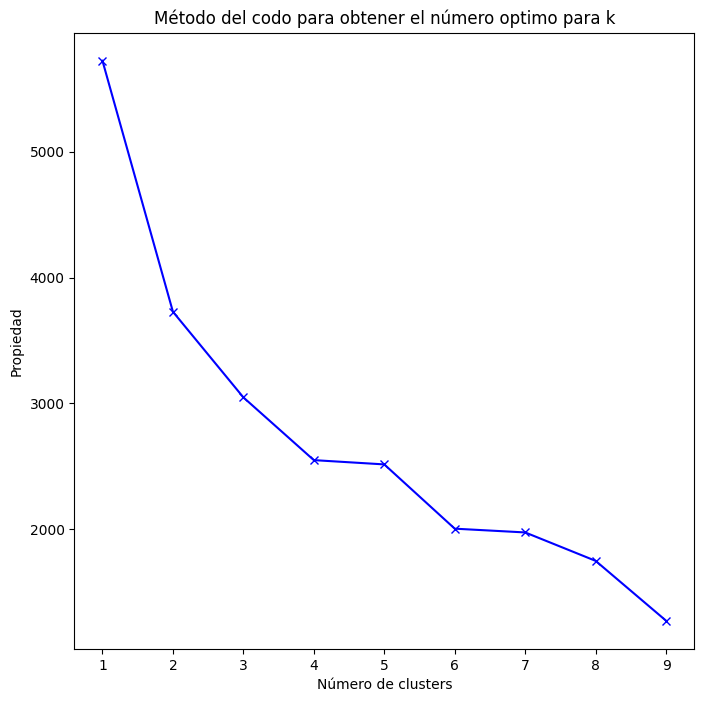

In [53]:
#temp = alojamientos_gdf[['property_type','room_type']]
temp = alojamientos_gdf[['property_type','room_type']]

# Elbow curve to find optimal K
cluster = []
#cluster2 = []
K = range(1,10)
for num_clusters in list(K):
    kmode = KModes(n_clusters=num_clusters, init = "random", n_init = 10, verbose=0, random_state = 0)
    #kmode2 = KModes(n_clusters=num_clusters, init = "Huang o Cao", n_init = 10, verbose=0, random_state = 0)
    #KModes(n_clusters=num_clusters, init = "random", n_init = 5, verbose=0)
    kmode.fit_predict(temp)
    #kmode2.fit_predict(temp)
    cluster.append(kmode.cost_)
    #cluster2.append(kmode2.cost_)
    
plt.plot(K, cluster, 'bx-')
#plt.plot(K, cluster2, 'bx-')
plt.xlabel('Número de clusters')
plt.ylabel('Propiedad')
plt.title('Método del codo para obtener el número optimo para k')
plt.show()

In [54]:
alojamientos_gdf.groupby(['property_type'], as_index=False)['id'].count()

,property_type,id
0,Boat,1
1,Camper/RV,2
2,Campsite,1
3,Casa particular,3
4,Entire bungalow,10
5,Entire condo,545
6,Entire cottage,1
7,Entire guest suite,473
8,Entire guesthouse,68
9,Entire home,681


In [55]:
# Building the model with 3 clusters
kmode = KModes(n_clusters=2, init = "random", n_init = 10, verbose=0, random_state = 0)
clusters = kmode.fit_predict(temp)
#print(kmode.cluster_centroids_)
#print(kmode.labels)
#alojamientos_gdf.insert(0, "property_type_kmode", clusters, True)
alojamientos_gdf['property_type_cluster'] = clusters #kmode.fit_predict(temp)

In [56]:
alojamientos_gdf.groupby(['property_type_cluster'], as_index=False)['id'].count().sort_values(by = 'property_type_cluster', ascending=False)

,property_type_cluster,id
1,1,1425
0,0,5045


In [57]:
alojamientos_gdf.groupby(['property_type','property_type_cluster'], as_index=False)['id'].count().sort_values(by = 'property_type_cluster', ascending=False)


,property_type,property_type_cluster,id
26,Private room in home,1,571
37,Room in boutique hotel,1,111
30,Private room in resort,1,1
29,Private room in rental unit,1,232
28,Private room in loft,1,6
27,Private room in hostel,1,4
33,Private room in villa,1,3
25,Private room in guesthouse,1,9
24,Private room in guest suite,1,35
23,Private room in condo,1,72


Dataset final

In [58]:
print(f'Observaciones: {alojamientos_gdf.shape[0]}, Características: {alojamientos_gdf.shape[1]}')

Observaciones: 6470, Características: 76


In [59]:
alojamientos_gdf.head(4)

,id,neighborhood_overview,host_id,host_name,host_location,host_about,host_response_rate,host_acceptance_rate,host_is_superhost,host_thumbnail_url,host_picture_url,host_neighbourhood,host_verifications,host_has_profile_pic,host_identity_verified,neighbourhood_cleansed,latitude,longitude,property_type,room_type,accommodates,bedrooms,beds,price,minimum_nights,maximum_nights,has_availability,availability_30,availability_60,availability_90,availability_365,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month,geometry,log_price,bathrooms_quantity,shared_room,private_room,hotel_room,entire_home_apt,has_Breakfast,has_Washer,has_Dishwasher,has_Dryer,has_TV,has_Freezer,has_Airconditioning,has_Heating,has_Hotwater,has_Cleaningproducts,has_Wifi,has_Hairdryer,has_Kitchen,has_Dedicatedworkspace,has_Petsallowed,has_Pool,has_Freestreetparking,has_Freeparkingonpremises,has_Smokealarm,has_Securitycamerasonproperty,host_response_time_hour,property_type_cluster
0,3686,1,4645,1,1,1,1.00,1.00,0,1,1,1,3,1,1,Historic Anacostia,38.86339,-76.98889,Private room in home,Private room,1.0,1,1,67.0,31,365,1,0,1,31,306,81,5,0,4.63,4.72,4.43,4.90,4.83,3.86,4.62,0,1,0,1,0,0.56,POINT (-76.98889 38.86339),4.204693,1.0,0,1,0,0,0,1,1,1,0,0,0,1,1,0,1,0,1,0,0,0,1,0,1,0,24,1
1,841260,1,315148,1,1,1,0.81,0.48,0,1,1,1,2,1,1,"Brightwood Park, Crestwood, Petworth",38.93719,-77.02335,Private room in rental unit,Private room,1.0,1,1,39.0,31,360,1,0,0,0,46,14,0,0,4.43,4.36,3.93,4.86,4.86,4.57,4.29,0,46,0,46,0,0.12,POINT (-77.02335 38.93719),3.663562,2.0,0,1,0,0,0,0,0,0,0,0,0,1,1,0,1,0,1,1,0,0,0,0,1,0,3,1
2,3943,1,5059,1,1,1,1.00,0.76,1,1,1,1,2,1,1,"Edgewood, Bloomingdale, Truxton Circle, Eckington",38.91195,-77.00456,Private room in townhouse,Private room,3.0,1,2,75.0,1,1125,1,3,10,23,298,443,9,0,4.82,4.88,4.91,4.94,4.90,4.55,4.74,0,4,0,4,0,2.73,POINT (-77.00456 38.91195),4.317488,1.0,0,1,0,0,0,0,1,1,0,1,0,1,1,1,1,1,1,1,0,0,1,0,1,1,1,1
3,842418,1,2236092,1,1,1,0.80,0.93,1,1,1,1,2,1,1,"Downtown, Chinatown, Penn Quarters, Mount Vern...",38.89898,-77.01629,Entire condo,Entire home/apt,2.0,1,1,250.0,31,1125,1,30,60,90,90,69,22,0,4.78,4.85,4.69,4.51,4.66,4.96,4.67,0,1,1,0,0,0.59,POINT (-77.01629 38.89898),5.521461,1.5,0,0,0,1,0,1,1,1,0,1,1,1,1,0,1,1,1,0,0,1,0,0,0,0,24,0


Se hace un conteo de alojamientos por barrios, se calcula el precio y la calificación general promedio por barrio para añadirlos en el dataset de barrios.

In [60]:
# host_is_superhost
# host_identity_verified
# availability_365
# review_scores_rating	review_scores_accuracy	review_scores_cleanliness	review_scores_checkin	review_scores_communication	review_scores_location	review_scores_value

datos_tmp = alojamientos_gdf[["neighbourhood_cleansed","price"]].copy()
datos_tmp = datos_tmp.groupby(['neighbourhood_cleansed'], as_index=False)['price'].mean()
datos_tmp.rename(columns={'neighbourhood_cleansed': 'neighbourhood', 'price': 'price_mean'}, inplace=True)

datos_tmp2 = alojamientos_gdf[["neighbourhood_cleansed","review_scores_rating"]].copy()
datos_tmp2 = datos_tmp2.groupby(['neighbourhood_cleansed'], as_index=False)['review_scores_rating'].mean()
datos_tmp2.rename(columns={'neighbourhood_cleansed': 'neighbourhood', 'review_scores_rating': 'review_scores_rating_mean'}, inplace=True)

datos_tmp4 = alojamientos_gdf[["neighbourhood_cleansed","id"]].copy()
datos_tmp4 = datos_tmp4.groupby(['neighbourhood_cleansed'], as_index=False)['id'].count()
datos_tmp4.rename(columns={'neighbourhood_cleansed': 'neighbourhood', 'id': 'conteo_alojamientos'}, inplace=True)

datos_tmp5 = alojamientos_gdf[["neighbourhood_cleansed","minimum_nights"]].copy()
datos_tmp5 = datos_tmp5.groupby(['neighbourhood_cleansed'], as_index=False)['minimum_nights'].mean()
datos_tmp5.rename(columns={'neighbourhood_cleansed': 'neighbourhood', 'minimum_nights': 'minimum_nights_mean'}, inplace=True)

datos_tmp6 = alojamientos_gdf[["neighbourhood_cleansed","availability_365"]].copy()
datos_tmp6 = datos_tmp6.groupby(['neighbourhood_cleansed'], as_index=False)['availability_365'].mean()
datos_tmp6.rename(columns={'neighbourhood_cleansed': 'neighbourhood', 'availability_365': 'availability_365_mean'}, inplace=True)

datos_tmp3 = pd.merge(datos_tmp, datos_tmp2, on='neighbourhood', how='left')

vecindarios_airbnb = pd.merge(vecindarios_airbnb, datos_tmp3, on='neighbourhood', how='left')
vecindarios_airbnb = pd.merge(vecindarios_airbnb, datos_tmp4, on='neighbourhood', how='left')
vecindarios_airbnb = pd.merge(vecindarios_airbnb, datos_tmp5, on='neighbourhood', how='left')
vecindarios_airbnb = pd.merge(vecindarios_airbnb, datos_tmp6, on='neighbourhood', how='left')
vecindarios_airbnb.drop("neighbourhood_group", axis = 1, inplace = True)

# Redondeo a dos dígitos y se crean las nuevas columnas
vecindarios_airbnb["price_mean"] = round(vecindarios_airbnb.price_mean, 2)
vecindarios_airbnb["review_scores_rating_mean"] = round(vecindarios_airbnb.review_scores_rating_mean, 2)
vecindarios_airbnb["minimum_nights_mean"] = round(vecindarios_airbnb.minimum_nights_mean, 2)
vecindarios_airbnb["availability_365_mean"] = round(vecindarios_airbnb.availability_365_mean, 2)
vecindarios_airbnb["conteo_alojamientos"] = round(vecindarios_airbnb.conteo_alojamientos, 2)

Cálculo de la distancia mínima entre el alojamiento y los distintos puntos de interés.

In [61]:
# Función que calcula la distancia
def min_distance(point, lines):
    return lines.distance(point).min()

# Convertir a CRS de tipo 2272 para poder obtener las distancias en pies
alojamientos_gdf = alojamientos_gdf.to_crs('EPSG:2272')
bank_location = bank_location.to_crs('EPSG:2272')
recreation_facilities = recreation_facilities.to_crs('EPSG:2272')
metro_bus_stop = metro_bus_stop.to_crs('EPSG:2272')
point_of_interest = point_of_interest.to_crs('EPSG:2272')
CASA_BLANCA = CASA_BLANCA.to_crs('EPSG:2272')
LINCOLN_MEMORIAL = LINCOLN_MEMORIAL.to_crs('EPSG:2272')
NATIONAL_AIR_AND_SPACE_MUSEUM = NATIONAL_AIR_AND_SPACE_MUSEUM.to_crs('EPSG:2272')
WASHINGTON_MONUMENT = WASHINGTON_MONUMENT.to_crs('EPSG:2272')
NATIONAL_ZOOLOGICAL_PARK = NATIONAL_ZOOLOGICAL_PARK.to_crs('EPSG:2272')
crime_incidents = crime_incidents.to_crs('EPSG:2272')

# Creación de nuevas columnas en el dataset con las distancias en pies.
alojamientos_gdf['min_dist_to_bank_ft'] = alojamientos_gdf.geometry.apply(min_distance, args=(bank_location,))
alojamientos_gdf['min_dist_to_recreation_ft'] = alojamientos_gdf.geometry.apply(min_distance, args=(recreation_facilities,))
alojamientos_gdf['min_dist_to_metro_bus_stop_ft'] = alojamientos_gdf.geometry.apply(min_distance, args=(metro_bus_stop,))
alojamientos_gdf['min_dist_to_points_interest_ft'] = alojamientos_gdf.geometry.apply(min_distance, args=(point_of_interest,))
alojamientos_gdf['min_dist_to_white_house_ft'] = alojamientos_gdf.geometry.apply(min_distance, args=(CASA_BLANCA,))
alojamientos_gdf['min_dist_to_lincoln_memorial_ft'] = alojamientos_gdf.geometry.apply(min_distance, args=(LINCOLN_MEMORIAL,))
alojamientos_gdf['min_dist_to_national_space_museum_ft'] = alojamientos_gdf.geometry.apply(min_distance, args=(NATIONAL_AIR_AND_SPACE_MUSEUM,))
alojamientos_gdf['min_dist_to_washington_memorial_ft'] = alojamientos_gdf.geometry.apply(min_distance, args=(WASHINGTON_MONUMENT,))
alojamientos_gdf['min_dist_to_national_zoo_ft'] = alojamientos_gdf.geometry.apply(min_distance, args=(NATIONAL_ZOOLOGICAL_PARK,))
alojamientos_gdf['min_dist_to_crime_incident_ft'] = alojamientos_gdf.geometry.apply(min_distance, args=(crime_incidents,))

# **Dataset Final**

In [62]:
#print(alojamientos_gdf.head())
#print(alojamientos_gdf.info())
alojamientos_gdf.describe()

,id,neighborhood_overview,host_id,host_name,host_location,host_about,host_response_rate,host_acceptance_rate,host_is_superhost,host_thumbnail_url,host_picture_url,host_neighbourhood,host_verifications,host_has_profile_pic,host_identity_verified,latitude,longitude,accommodates,bedrooms,beds,price,minimum_nights,maximum_nights,has_availability,availability_30,availability_60,availability_90,availability_365,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month,log_price,bathrooms_quantity,shared_room,private_room,hotel_room,entire_home_apt,has_Breakfast,has_Washer,has_Dishwasher,has_Dryer,has_TV,has_Freezer,has_Airconditioning,has_Heating,has_Hotwater,has_Cleaningproducts,has_Wifi,has_Hairdryer,has_Kitchen,has_Dedicatedworkspace,has_Petsallowed,has_Pool,has_Freestreetparking,has_Freeparkingonpremises,has_Smokealarm,has_Securitycamerasonproperty,host_response_time_hour,property_type_cluster,min_dist_to_bank_ft,min_dist_to_recreation_ft,min_dist_to_metro_bus_stop_ft,min_dist_to_points_interest_ft,min_dist_to_white_house_ft,min_dist_to_lincoln_memorial_ft,min_dist_to_national_space_museum_ft,min_dist_to_washington_memorial_ft,min_dist_to_national_zoo_ft,min_dist_to_crime_incident_ft
count,6.470000e+03,6470.000000,6.470000e+03,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6.470000e+03,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000,6470.000000
mean,1.000300e+17,0.685008,1.107225e+08,0.975116,0.845131,0.628594,0.742536,0.745906,0.304791,0.975116,0.975116,0.894900,2.117311,0.969088,0.824884,38.912001,-77.017199,3.659815,1.523493,1.960278,179.202009,21.409583,2.203769e+03,0.930603,8.587944,21.953323,38.652396,175.436167,49.630603,13.953478,1.022257,4.723020,4.805537,4.758478,4.861066,4.844605,4.788156,4.704296,0.409583,23.577125,21.006028,2.209737,0.253168,1.820300,4.890789,1.383972,0.017002,0.220247,0.003091,0.759660,0.064760,0.535858,0.498454,0.496600,0.486090,0.294900,0.708810,0.783462,0.757960,0.283617,0.911128,0.783771,0.888253,0.476507,0.001391,0.051777,0.436167,0.329057,0.968006,0.290881,3.558269,0.220247,2237.188806,1967.884193,434.585111,541.979664,14114.563116,17188.282926,14798.973365,15435.324709,15799.359074,497.237882
std,2.316636e+17,0.464549,1.301262e+08,0.155784,0.361807,0.483218,0.418752,0.378428,0.460355,0.155784,0.155784,0.306707,0.528074,0.173092,0.380096,0.029096,0.034854,2.346814,0.935047,1.375806,271.894825,40.722161,1.243147e+05,0.254148,10.226961,21.378878,32.868356,134.241025,83.457280,21.673197,2.492059,0.443596,0.311873,0.323868,0.291337,0.307193,0.300982,0.345816,0.491795,54.514546,54.397663,7.808165,1.893571,2.188927,0.691090,0.750768,0.129287,0.414445,0.055517,0.427323,0.246122,0.498751,0.500036,0.500027,0.499845,0.456033,0.454346,0.411917,0.428352,0.450788,0.284580,0.411704,0.315079,0.499486,0.037274,0.221594,0.495947,0.46990

**Revision de nulos del dataset final**

In [63]:
alojamientos_gdf.columns

Index(['id', 'neighborhood_overview', 'host_id', 'host_name', 'host_location', 'host_about', 'host_response_rate', 'host_acceptance_rate', 'host_is_superhost', 'host_thumbnail_url', 'host_picture_url', 'host_neighbourhood', 'host_verifications', 'host_has_profile_pic', 'host_identity_verified', 'neighbourhood_cleansed', 'latitude', 'longitude', 'property_type', 'room_type', 'accommodates', 'bedrooms', 'beds', 'price', 'minimum_nights', 'maximum_nights', 'has_availability', 'availability_30', 'availability_60', 'availability_90', 'availability_365', 'number_of_reviews', 'number_of_reviews_ltm', 'number_of_reviews_l30d', 'review_scores_rating', 'review_scores_accuracy', 'review_scores_cleanliness', 'review_scores_checkin', 'review_scores_communication', 'review_scores_location', 'review_scores_value', 'instant_bookable', 'calculated_host_listings_count', 'calculated_host_listings_count_entire_homes', 'calculated_host_listings_count_private_rooms', 'calculated_host_listings_count_shared_r

Ya no hay valores vacíos en el dataset

In [64]:
alojamientos_gdf.isnull().sum()

id                                              0
neighborhood_overview                           0
host_id                                         0
host_name                                       0
host_location                                   0
host_about                                      0
host_response_rate                              0
host_acceptance_rate                            0
host_is_superhost                               0
host_thumbnail_url                              0
host_picture_url                                0
host_neighbourhood                              0
host_verifications                              0
host_has_profile_pic                            0
host_identity_verified                          0
neighbourhood_cleansed                          0
latitude                                        0
longitude                                       0
property_type                                   0
room_type                                       0


In [65]:
alojamientos_gdf.select_dtypes(include=['object']).describe()    #.drop(columns=['name', 'host_name']).describe()

,neighbourhood_cleansed,property_type,room_type
count,6470,6470,6470
unique,39,51,4
top,"Capitol Hill, Lincoln Park",Entire rental unit,Entire home/apt
freq,561,2301,4915


Diferentes datos estadísticos del dataset.

In [66]:
#alojamientos_gdf.describe()
alojamientos_gdf.describe().loc[('mean', 'min', 'max'),:]
#alojamientos_gdf.describe(include=['float64','int32','int64']).loc[('count', 'min', 'max'),:]
#alojamientos_gdf.describe(include=['float64','int32','int64']).loc[('count', 'min', 'max'),:]

,id,neighborhood_overview,host_id,host_name,host_location,host_about,host_response_rate,host_acceptance_rate,host_is_superhost,host_thumbnail_url,host_picture_url,host_neighbourhood,host_verifications,host_has_profile_pic,host_identity_verified,latitude,longitude,accommodates,bedrooms,beds,price,minimum_nights,maximum_nights,has_availability,availability_30,availability_60,availability_90,availability_365,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month,log_price,bathrooms_quantity,shared_room,private_room,hotel_room,entire_home_apt,has_Breakfast,has_Washer,has_Dishwasher,has_Dryer,has_TV,has_Freezer,has_Airconditioning,has_Heating,has_Hotwater,has_Cleaningproducts,has_Wifi,has_Hairdryer,has_Kitchen,has_Dedicatedworkspace,has_Petsallowed,has_Pool,has_Freestreetparking,has_Freeparkingonpremises,has_Smokealarm,has_Securitycamerasonproperty,host_response_time_hour,property_type_cluster,min_dist_to_bank_ft,min_dist_to_recreation_ft,min_dist_to_metro_bus_stop_ft,min_dist_to_points_interest_ft,min_dist_to_white_house_ft,min_dist_to_lincoln_memorial_ft,min_dist_to_national_space_museum_ft,min_dist_to_washington_memorial_ft,min_dist_to_national_zoo_ft,min_dist_to_crime_incident_ft
mean,1.000300e+17,0.685008,1.107225e+08,0.975116,0.845131,0.628594,0.742536,0.745906,0.304791,0.975116,0.975116,0.8949,2.117311,0.969088,0.824884,38.912001,-77.017199,3.659815,1.523493,1.960278,179.202009,21.409583,2.203769e+03,0.930603,8.587944,21.953323,38.652396,175.436167,49.630603,13.953478,1.022257,4.72302,4.805537,4.758478,4.861066,4.844605,4.788156,4.704296,0.409583,23.577125,21.006028,2.209737,0.253168,1.8203,4.890789,1.383972,0.017002,0.220247,0.003091,0.75966,0.06476,0.535858,0.498454,0.4966,0.48609,0.2949,0.70881,0.783462,0.75796,0.283617,0.911128,0.783771,0.888253,0.476507,0.001391,0.051777,0.436167,0.329057,0.968006,0.290881,3.558269,0.220247,2237.188806,1967.884193,434.585111,541.979664,14114.563116,17188.282926,14798.973365,15435.324709,15799.359074,497.237882
min,3.571000e+03,0.000000,4.492000e+03,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0000,1.000000,0.000000,0.000000,38.809610,-77.133630,1.000000,1.000000,1.000000,10.000000,1.000000,1.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.0100,2.302585,0.500000,0.000000,0.000000,0.000000,0.00000,0.00000,0.000000,0.000000,0.0000,0.00000,0.0000,0.00000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,8.176257,20.240755,2.767062,0.620009,968.812741,2641.537640,2061.859174,2991.983506,409.169437,1.368881
max,7.151515e+17,1.000000,4.788802e+08,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.0000,3.000000,1.000000,1.000000,39.007350,-76.891490,16.000000,15.000000,20.000000,10000.000000,1125.000000,9.999999e+06,1.000000,30.000000,60.000000,90.000000,365.000000,875.000000,341.000000,119.000000,5.00000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,1.000000,235.000000,235.000000,59.000000,20.000000,105.0000,9.210340,15.000000,1.000000,1.000000,1.000000,1.00000,1.00000,1.000000,1.000000,1.0000,1.00000,1.0000,1.00000,1.000000,1.00000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,48.000000,1.000000,13350.621643,10886.456038,4958.527238,7379.596498,41443.220902,45186.849729,43972.982217,43035.809229,47269.861823,7864.576458


# **Estudio de correlación**

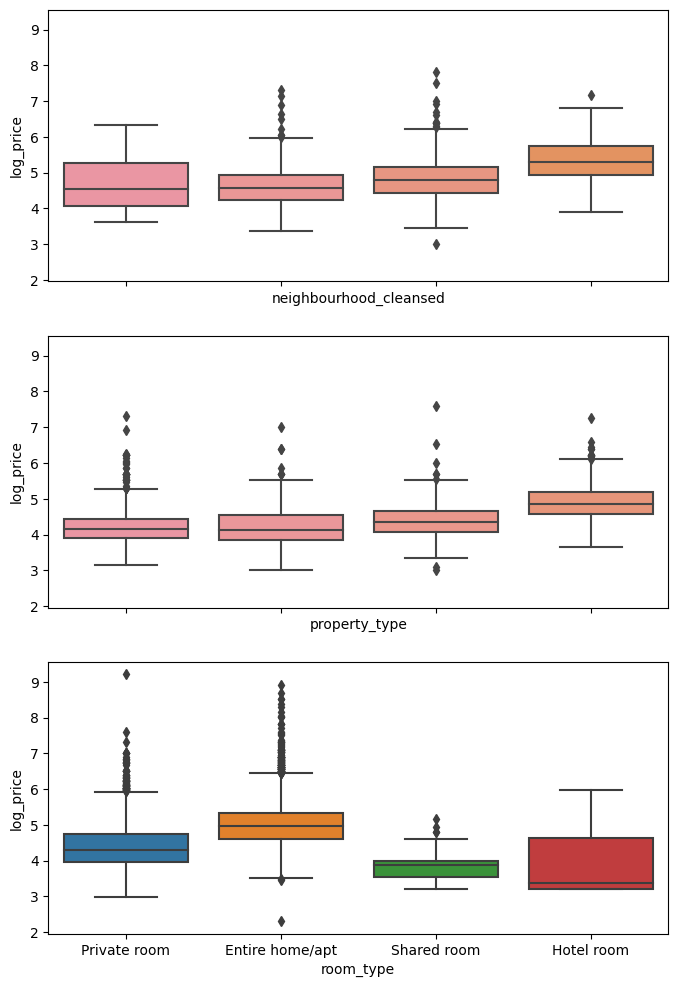

In [67]:
import matplotlib.pyplot as plt

cat_vars = ['neighbourhood_cleansed', 'property_type', 'room_type']
n_rows = len(cat_vars)
fig, axes = plt.subplots(n_rows, 1, figsize=(8, 12), sharex=True)
for i, var in enumerate(cat_vars):
    sns.boxplot(data=alojamientos_gdf, x=var, y='log_price', ax=axes[i])

In [68]:
alojamientos_gdf.head()

,id,neighborhood_overview,host_id,host_name,host_location,host_about,host_response_rate,host_acceptance_rate,host_is_superhost,host_thumbnail_url,host_picture_url,host_neighbourhood,host_verifications,host_has_profile_pic,host_identity_verified,neighbourhood_cleansed,latitude,longitude,property_type,room_type,accommodates,bedrooms,beds,price,minimum_nights,maximum_nights,has_availability,availability_30,availability_60,availability_90,availability_365,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month,geometry,log_price,bathrooms_quantity,shared_room,private_room,hotel_room,entire_home_apt,has_Breakfast,has_Washer,has_Dishwasher,has_Dryer,has_TV,has_Freezer,has_Airconditioning,has_Heating,has_Hotwater,has_Cleaningproducts,has_Wifi,has_Hairdryer,has_Kitchen,has_Dedicatedworkspace,has_Petsallowed,has_Pool,has_Freestreetparking,has_Freeparkingonpremises,has_Smokealarm,has_Securitycamerasonproperty,host_response_time_hour,property_type_cluster,min_dist_to_bank_ft,min_dist_to_recreation_ft,min_dist_to_metro_bus_stop_ft,min_dist_to_points_interest_ft,min_dist_to_white_house_ft,min_dist_to_lincoln_memorial_ft,min_dist_to_national_space_museum_ft,min_dist_to_washington_memorial_ft,min_dist_to_national_zoo_ft,min_dist_to_crime_incident_ft
0,3686,1,4645,1,1,1,1.00,1.00,0,1,1,1,3,1,1,Historic Anacostia,38.863390,-76.988890,Private room in home,Private room,1.0,1,1,67.0,31,365,1,0,1,31,306,81,5,0,4.63,4.72,4.43,4.90,4.83,3.86,4.62,0,1,0,1,0,0.56,POINT (2185298.724 -170273.677),4.204693,1.0,0,1,0,0,0,1,1,1,0,0,0,1,1,0,1,0,1,0,0,0,1,0,1,0,24,1,536.960103,2387.660879,447.137720,409.303462,18445.135222,19837.451113,12621.584789,16265.302853,29671.409624,53.055318
1,841260,1,315148,1,1,1,0.81,0.48,0,1,1,1,2,1,1,"Brightwood Park, Crestwood, Petworth",38.937190,-77.023350,Private room in rental unit,Private room,1.0,1,1,39.0,31,360,1,0,0,0,46,14,0,0,4.43,4.36,3.93,4.86,4.86,4.57,4.29,0,46,0,46,0,0.12,POINT (2175261.938 -143469.408),3.663562,2.0,0,1,0,0,0,0,0,0,0,0,0,1,1,0,1,0,1,1,0,0,0,0,1,0,3,1,1499.303227,969.780473,249.332046,201.834585,14878.501030,19057.835190,17878.989571,17712.554451,7216.049775,149.005694
2,3943,1,5059,1,1,1,1.00,0.76,1,1,1,1,2,1,1,"Edgewood, Bloomingdale, Truxton Circle, Eckington",38.911950,-77.004560,Private room in townhouse,Private room,3.0,1,2,75.0,1,1125,1,3,10,23,298,443,9,0,4.82,4.88,4.91,4.94,4.90,4.55,4.74,0,4,0,4,0,2.73,POINT (2180685.964 -152620.248),4.317488,1.0,0,1,0,0,0,0,1,1,0,1,0,1,1,1,1,1,1,1,0,0,1,0,1,1,1,1,1775.922417,1200.929814,229.894550,144.385924,10486.545887,15394.209891,9685.391517,11974.543265,13984.115705,107.579591
3,842418,1,2236092,1,1,1,0.80,0.93,1,1,1,1,2,1,1,"Downtown, Chinatown, Penn Quarters, Mount Vern...",38.898980,-77.016290,Entire condo,Entire home/apt,2.0,1,1,250.0,31,1125,1,30,60,90,90,69,22,0,4.78,4.85,4.69,4.51,4.66,4.96,4.67,0,1,1,0,0,0.59,POINT (2177386.412 -157373.454),5.521461,1.5,0,0,0,1,0,1,1,1,0,1,1,1,1,0,1,1,1,0,0,1,0,0,0,0,24,0,1648.678886,1984.155224,356.193457,143.253040,5786.821335,10277.465704,4056.820759,6413.109142,14582.462534,42.923049
4,860336,0,511136,1,1,1,1.00,1.00,0,1,1,1,3,1,1,"Dupont Circle, Connecticut Avenue/K Street",38.907833,-77.045673,Private room in guest suite,Private room,3.0,1,2,113.0,1,30,1,8,16,44,134,464,55,6,4.73,4.81,4.85,4.87,4.87,4.94,4.70,0,4,1,3,0,3.99,POINT (2168995.529 -154216.220),4.727388,1.0,0,1,0,0,0,1,0,1,0,0,0,1,1,0,0,1,0,0,0,0,0,0,1,1,1,1,615.566309,2314.561069,162.228176,5.960452,4521.775794,6885.819658,10263.471048,7319.629073,8383.875723,123.044571


Correlación de variables del alojamiento

Text(0.5, 1.0, 'Correlación de variables del alojamiento')

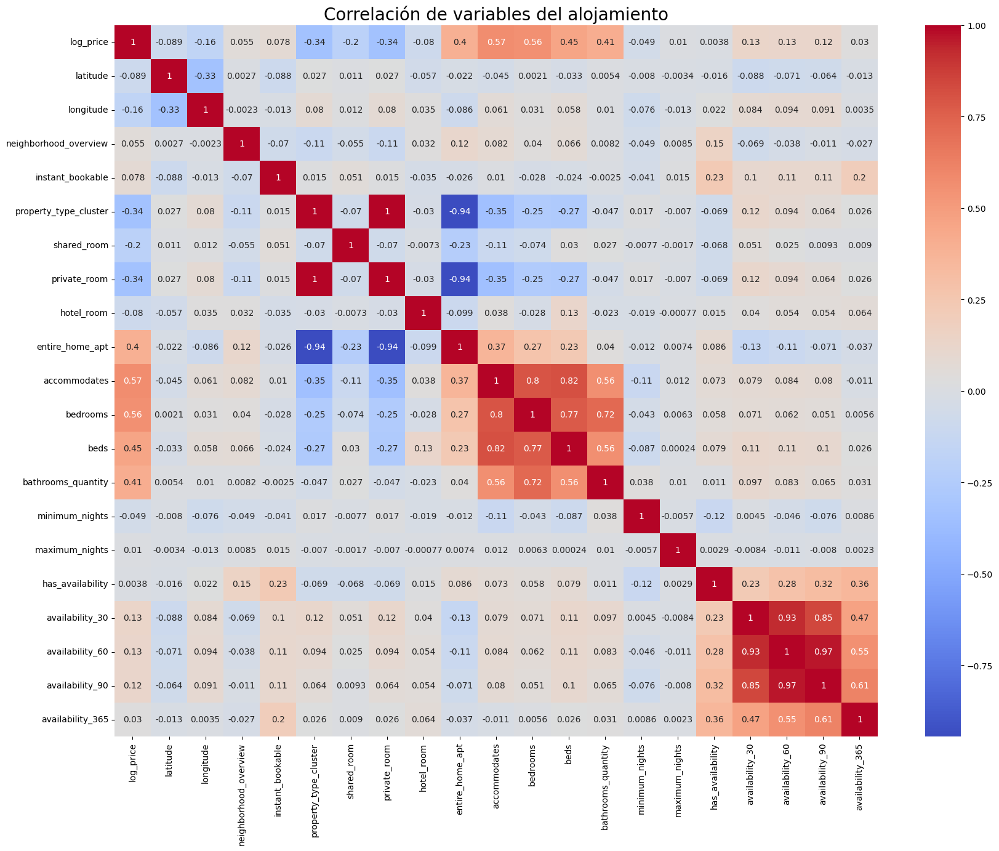

In [69]:
# con esta instrucción lo que hacemos es colocar más grande el mapa de calor
#plt.rcParams['figure.figsize'] = [10,8]
plt.rcParams.update({'font.size': 10})
hfig, axes = plt.subplots(figsize=(20,15))  
#'log_price','shared_room','private_room','hotel_room','entire_home_apt','accommodates', 'bedrooms',  'beds', 'bathrooms_quantity', 'minimum_nights','instant_bookable', 'availability_365', 'property_type_cluster'
listing_vars = ['log_price',
'latitude', 'longitude', 'neighborhood_overview', 'instant_bookable', 'neighbourhood_cleansed', 
'property_type', 'room_type', 'property_type_cluster', 'shared_room', 'private_room', 'hotel_room', 'entire_home_apt',
'accommodates', 'bedrooms', 'beds', 'bathrooms_quantity', 
'minimum_nights', 'maximum_nights', 
'has_availability', 'availability_30', 'availability_60', 'availability_90', 'availability_365'
]
# dibujamos el mapa con las correlaciones de todas las variables
sns.heatmap(alojamientos_gdf[listing_vars].corr(), cmap = 'coolwarm', ax = axes, annot=True) 
plt.title('Correlación de variables del alojamiento', fontsize=20)

Correlación de variables de servicios adicionales del alojamiento

Text(0.5, 1.0, 'Correlación de variables de servicios adicionales del alojamiento')

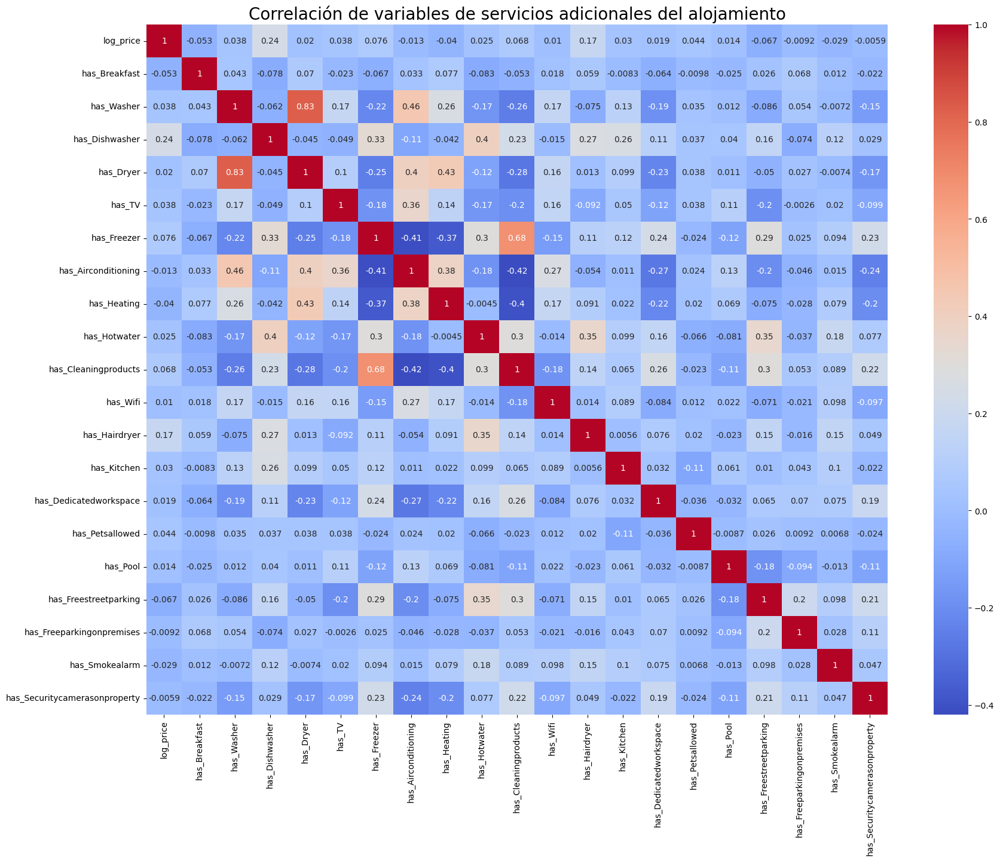

In [70]:
# con esta instrucción lo que hacemos es colocar más grande el mapa de calor
#plt.rcParams['figure.figsize'] = [10,8]
plt.rcParams.update({'font.size': 10})
hfig, axes = plt.subplots(figsize=(20,15))  
# dibujamos el mapa con las correlaciones de todas las variables
#'log_price','number_of_reviews', 'review_scores_rating', 'review_scores_accuracy', 'review_scores_cleanliness','review_scores_checkin', 'review_scores_communication','review_scores_location','review_scores_value'
amenities_vars=['log_price',
'has_Breakfast', 'has_Washer', 'has_Dishwasher', 'has_Dryer', 'has_TV', 'has_Freezer', 
'has_Airconditioning', 'has_Heating', 'has_Hotwater', 'has_Cleaningproducts', 'has_Wifi', 
'has_Hairdryer', 'has_Kitchen', 'has_Dedicatedworkspace', 'has_Petsallowed', 'has_Pool', 
'has_Freestreetparking', 'has_Freeparkingonpremises', 'has_Smokealarm', 'has_Securitycamerasonproperty'
]
sns.heatmap(alojamientos_gdf[amenities_vars].corr(), cmap = 'coolwarm', ax = axes, annot=True) 
plt.title('Correlación de variables de servicios adicionales del alojamiento', fontsize=20)

Correlación de variables de calificaciones del huésped

Text(0.5, 1.0, 'Correlación de variables de calificaciones del huésped')

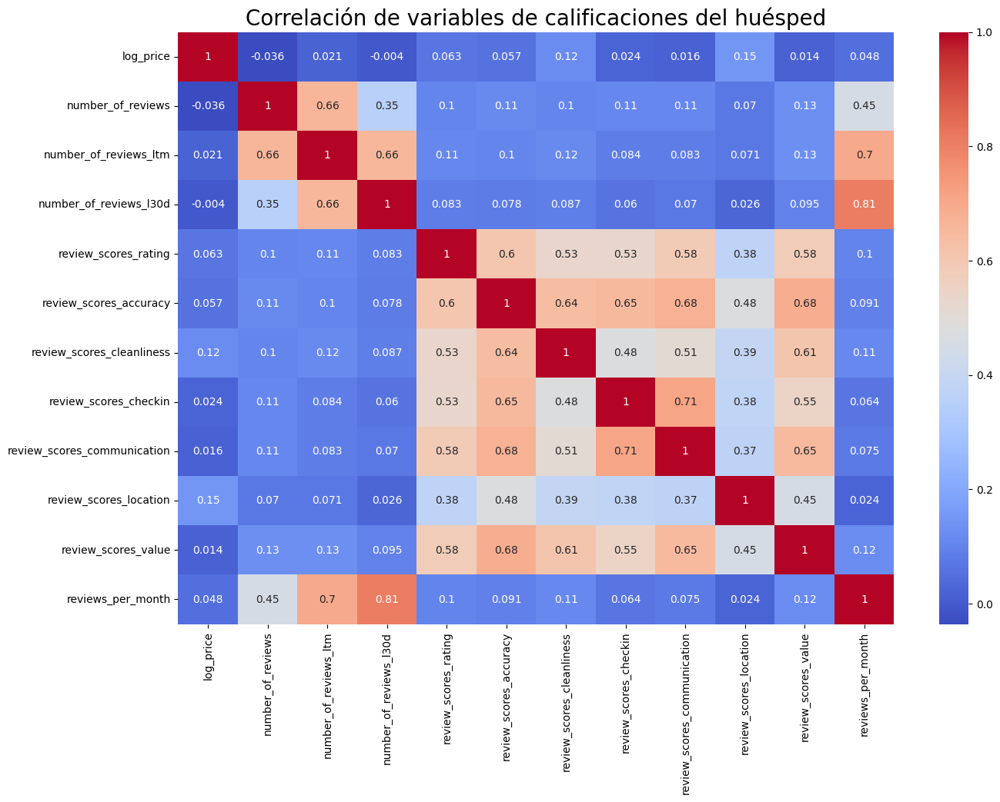

In [71]:
# con esta instrucción lo que hacemos es colocar más grande el mapa de calor
#plt.rcParams['figure.figsize'] = [10,8]
plt.rcParams.update({'font.size': 10})
hfig, axes = plt.subplots(figsize=(15,10))  
#'log_price','has_Breakfast','has_Washer', 'has_Dishwasher','has_Dryer', 'has_TV', 'has_Freezer','has_Airconditioning','has_Heating','has_Hotwater', 'has_Cleaningproducts','has_Wifi', 'has_Hairdryer','has_Kitchen', 'has_Dedicatedworkspace', 'has_Petsallowed', 'has_Pool', 'has_Freestreetparking', 'has_Freeparkingonpremises','has_Smokealarm', 'has_Securitycamerasonproperty'
score_vars = ['log_price','number_of_reviews', 'number_of_reviews_ltm', 'number_of_reviews_l30d', 
'review_scores_rating', 'review_scores_accuracy', 'review_scores_cleanliness', 'review_scores_checkin', 
'review_scores_communication', 'review_scores_location', 'review_scores_value', 'reviews_per_month']
# dibujamos el mapa con las correlaciones de todas las variables
sns.heatmap(alojamientos_gdf[score_vars].corr(), cmap = 'coolwarm', ax = axes, annot=True) 
plt.title('Correlación de variables de calificaciones del huésped', fontsize=20)

Correlación de variables del host

Text(0.5, 1.0, 'Correlación de variables del host')

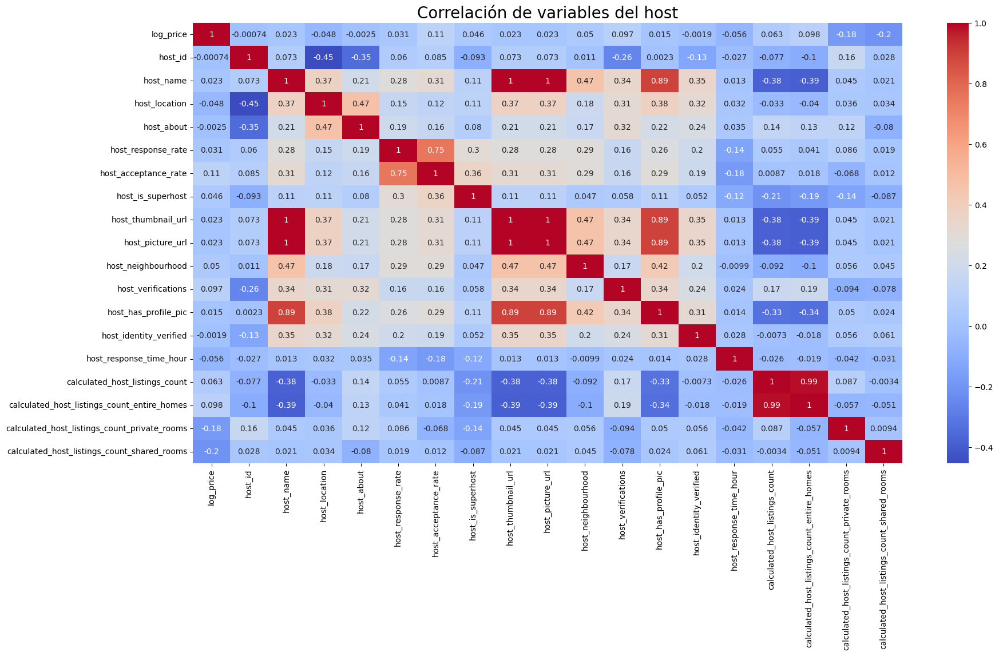

In [72]:
# con esta instrucción lo que hacemos es colocar más grande el mapa de calor
#plt.rcParams['figure.figsize'] = [20,10]
plt.rcParams.update({'font.size': 10})
hfig, axes = plt.subplots(figsize=(20,10))  
# dibujamos el mapa con las correlaciones de todas las variables
#host_vars = ['log_price','host_response_time_hour','host_about', 'host_is_superhost', 'host_picture_url', 'host_verifications', 'host_has_profile_pic', 'host_identity_verified','host_response_rate', 'host_acceptance_rate', 'calculated_host_listings_count']
host_vars = ['log_price','host_id', 'host_name', 'host_location', 'host_about', 'host_response_rate', 'host_acceptance_rate', 
'host_is_superhost', 'host_thumbnail_url', 'host_picture_url', 'host_neighbourhood', 'host_verifications', 
'host_has_profile_pic', 'host_identity_verified', 'host_response_time_hour', 
'calculated_host_listings_count', 'calculated_host_listings_count_entire_homes', 
'calculated_host_listings_count_private_rooms', 'calculated_host_listings_count_shared_rooms']
sns.heatmap(alojamientos_gdf[host_vars].corr(), cmap = 'coolwarm', ax = axes, annot=True) 
plt.title('Correlación de variables del host', fontsize=20)

Correlación de variables de ubicación

Text(0.5, 1.0, 'Correlación de variables de ubicación')

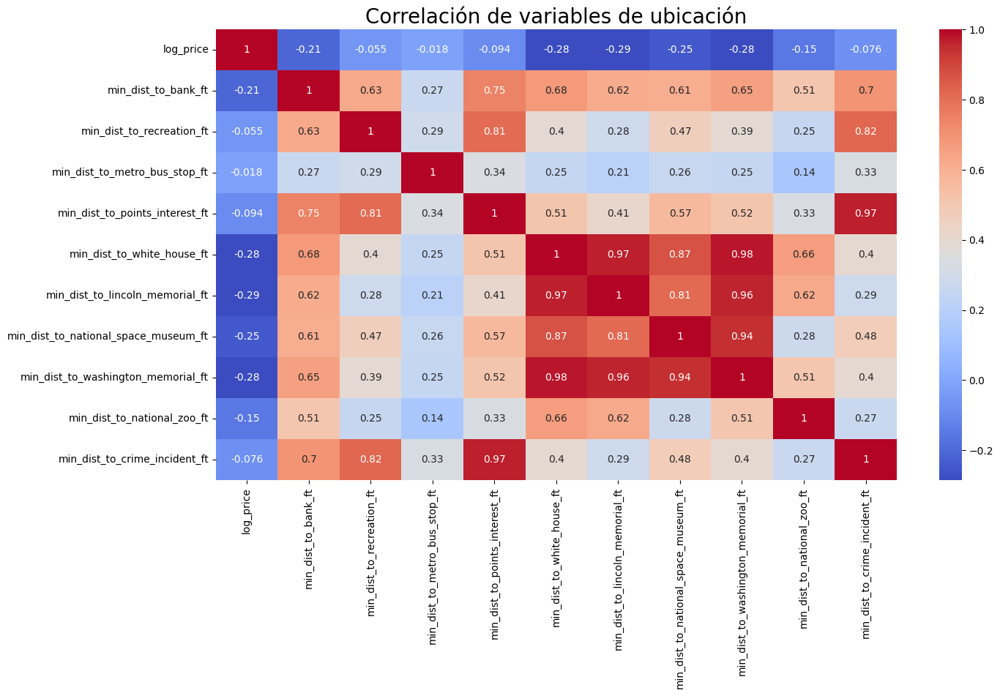

In [73]:
# con esta instrucción lo que hacemos es colocar más grande el mapa de calor
#plt.rcParams['figure.figsize'] = [10,8]
plt.rcParams.update({'font.size': 10})
hfig, axes = plt.subplots(figsize=(15,8))  
# dibujamos el mapa con las correlaciones de todas las variables
location_vars = ['log_price','min_dist_to_bank_ft', 'min_dist_to_recreation_ft', 'min_dist_to_metro_bus_stop_ft', 
'min_dist_to_points_interest_ft', 
'min_dist_to_white_house_ft', 'min_dist_to_lincoln_memorial_ft', 
'min_dist_to_national_space_museum_ft', 'min_dist_to_washington_memorial_ft', 
'min_dist_to_national_zoo_ft', 'min_dist_to_crime_incident_ft']
sns.heatmap(alojamientos_gdf[location_vars].corr(), cmap = 'coolwarm', ax = axes, annot=True) 
plt.title('Correlación de variables de ubicación', fontsize=20)

# **Revisión de outliers**

Se observa en el precio una distribución anormal.

Text(0.5, 1.0, 'Distribución del precio de los alojamientos')

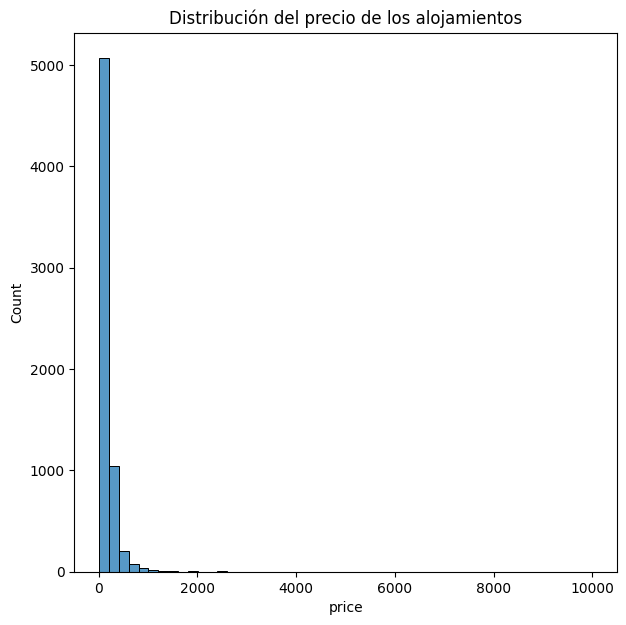

In [74]:
plt.rcParams['figure.figsize'] = [7, 7]
sns.histplot(alojamientos_gdf['price'], bins=50)
plt.title("Distribución del precio de los alojamientos")

In [178]:
print("Alojamientos menores o iguales a $500: " , alojamientos_gdf[alojamientos_gdf['price'] <= 500]["id"].count())
print("Alojamientos mayores a $500: " , alojamientos_gdf[alojamientos_gdf['price'] > 500]["id"].count())

Alojamientos menores o iguales a $500:  6235
Alojamientos mayores a $500:  235


El precio convertido a logaritmo se hizo para suavizar los datos y que tenga una distribución normal.

Text(0.5, 1.0, 'Distribución del precio de los alojamientos (logaritmo)')

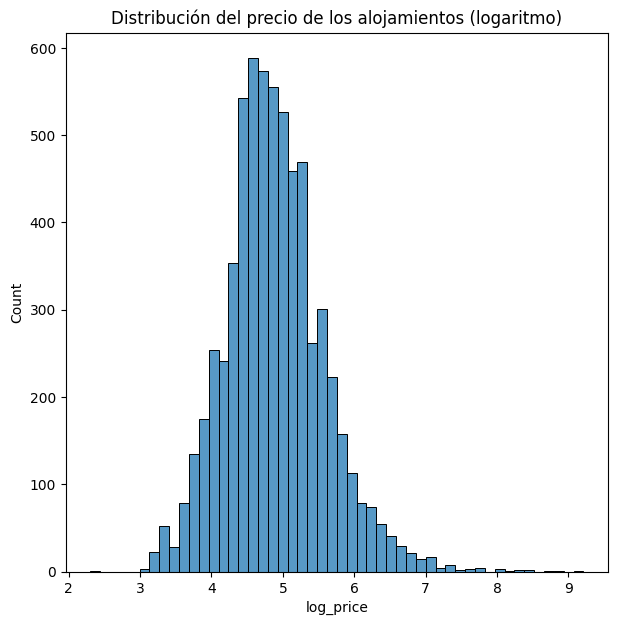

In [75]:
plt.rcParams['figure.figsize'] = [7, 7]
sns.histplot(alojamientos_gdf['log_price'], bins=50)
plt.title("Distribución del precio de los alojamientos (logaritmo)")

Se observa que entre más aumenta el número de personas permitidas en el alojamiento, más incrementa el precio.

In [76]:
#def obgener_valor_max_outlier(column):
#    cuantil = alojamientos_gdf[column].quantile([0.25,0.75])
#    q_upper = cuantil.values[1]
#    rango_intercuantilico = q_upper - cuantil.values[0]
#    max_outlier = upper + 1.5*(rango_intercuantilico)
#    return max_outlier

#obgener_valor_max_outlier('accommodates')
#rows_before = df.shape[0]
#alojamientos_gdf = alojamientos_gdf[alojamientos_gdf['price'] <= obgener_valor_max_outlier('price')]
#print(f'{rows_before-alojamientos_gdf.shape[0]} rows were removed')

In [77]:
xol = ["price", "log_price",  'property_type', 'room_type',
        #'shared_room', 'private_room', 'hotel_room', 'entire_home_apt', 
        'accommodates', 'bedrooms', 'beds', 'minimum_nights', 'bathrooms_quantity', 
        'maximum_nights', 'instant_bookable', 'availability_365', 'property_type_cluster'
       ]
#alojamientos_gdf[alojamientos_gdf['bedrooms'] > 10][xol] #.count()
#alojamientos_gdf['accommodates'].isnull().sum()

,price,log_price,property_type,room_type,accommodates,bedrooms,beds,minimum_nights,bathrooms_quantity,maximum_nights,instant_bookable,availability_365,property_type_cluster
5244,7500.0,8.922658,Entire home,Entire home/apt,16.0,15,20,2,15.0,10,1,281,0


<AxesSubplot: >

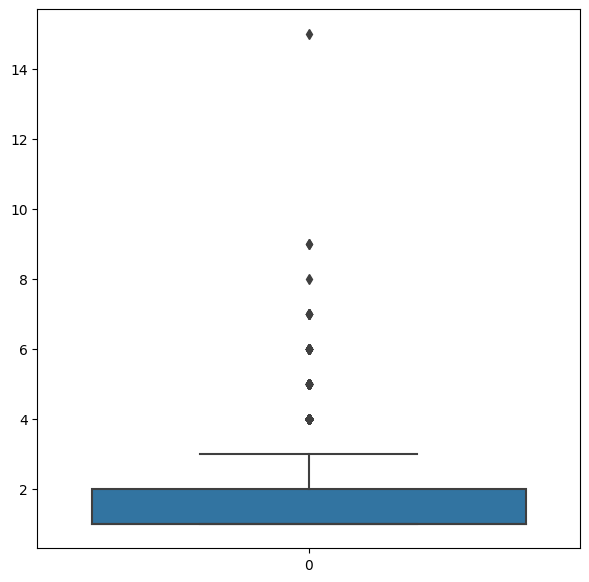

In [78]:
sns.boxplot(alojamientos_gdf['bedrooms'])

Text(0.5, 1.0, 'Número máximo de personas permitidas en el alojamiento vs precio')

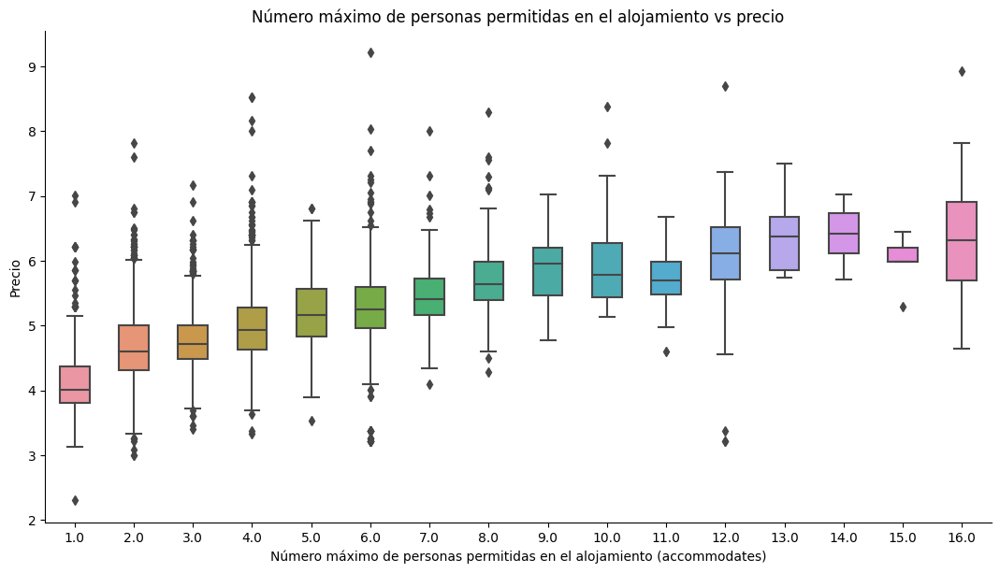

In [79]:
sns.catplot(
    data=alojamientos_gdf, 
    x='accommodates', y='log_price', kind='box',
    height=6, aspect=1.8, width=0.5
)
plt.xlabel("Número máximo de personas permitidas en el alojamiento (accommodates)")
plt.ylabel('Precio')
plt.title('Número máximo de personas permitidas en el alojamiento vs precio')

Se observa que eñ tipo de habitación "Entire Home/Apto" es el que más alto tiene los precios. Además se observan algunos outliers.

Text(0.5, 1.0, 'Tipo de habitación del alojamiento vs Precio')

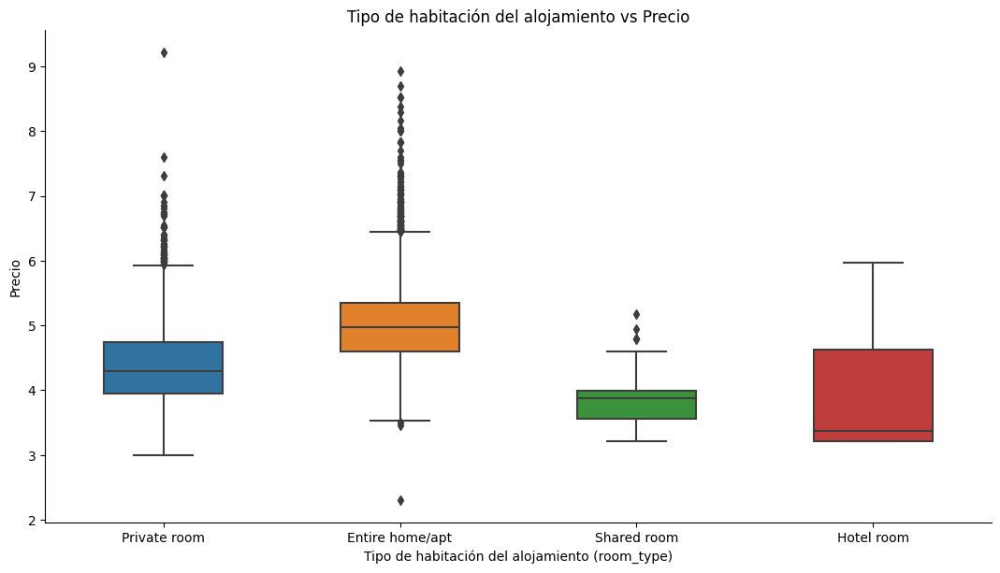

In [80]:
sns.catplot(
    data=alojamientos_gdf, 
    x='room_type', y='log_price', kind='box',
    height=6, aspect=1.8, width=0.5
)
plt.xlabel("Tipo de habitación del alojamiento (room_type)")
plt.ylabel('Precio')
plt.title('Tipo de habitación del alojamiento vs Precio')

Se observan algunos outliers en cuanto al número de baños del alojamiento.

Text(0.5, 1.0, 'Número de baños del alojamiento vs Precio')

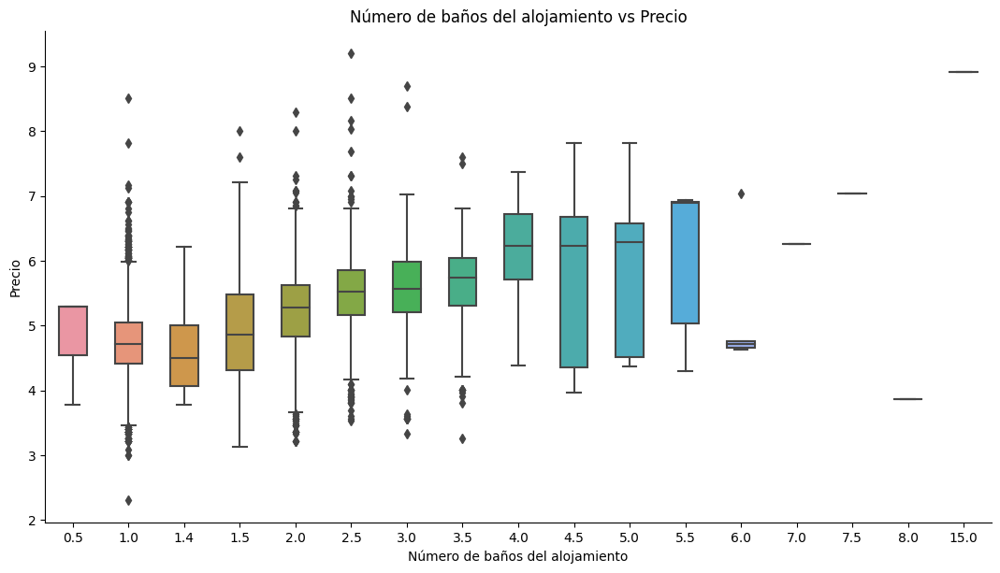

In [81]:
sns.catplot(
    data=alojamientos_gdf, 
    x='bathrooms_quantity', y='log_price', kind='box',
    height=6, aspect=1.8, width=0.5
)
plt.xlabel("Número de baños del alojamiento")
plt.ylabel('Precio')
plt.title('Número de baños del alojamiento vs Precio')

Se observan algunos outliers en cuanto al número de camas del alojamiento.

In [82]:
#sns.boxplot(alojamientos_gdf['beds'])

Text(0.5, 1.0, 'Número de camas del alojamiento vs Precio')

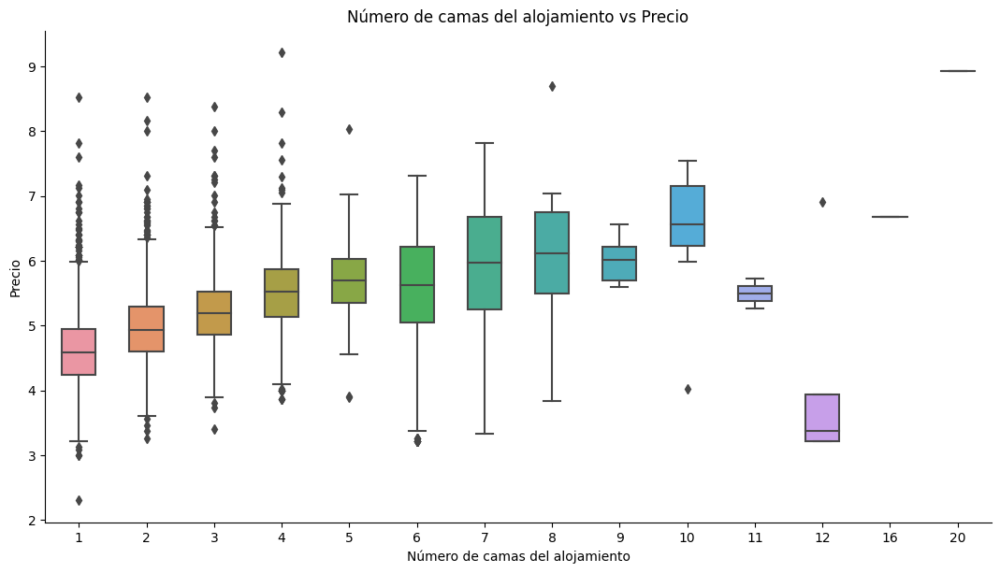

In [83]:
sns.catplot(
    data=alojamientos_gdf, 
    x='beds', y='log_price', kind='box',
    height=6, aspect=1.8, width=0.5
)
plt.xlabel("Número de camas del alojamiento")
plt.ylabel('Precio')
plt.title('Número de camas del alojamiento vs Precio')

Se observan algunos outliers en cuanto al número de habitaciones del alojamiento. Además se ve una tendencia a que entre más habitaciones tiene un alojamiento, más alto será su precio.

Text(0.5, 1.0, 'Número de habitaciones del alojamiento vs Precio')

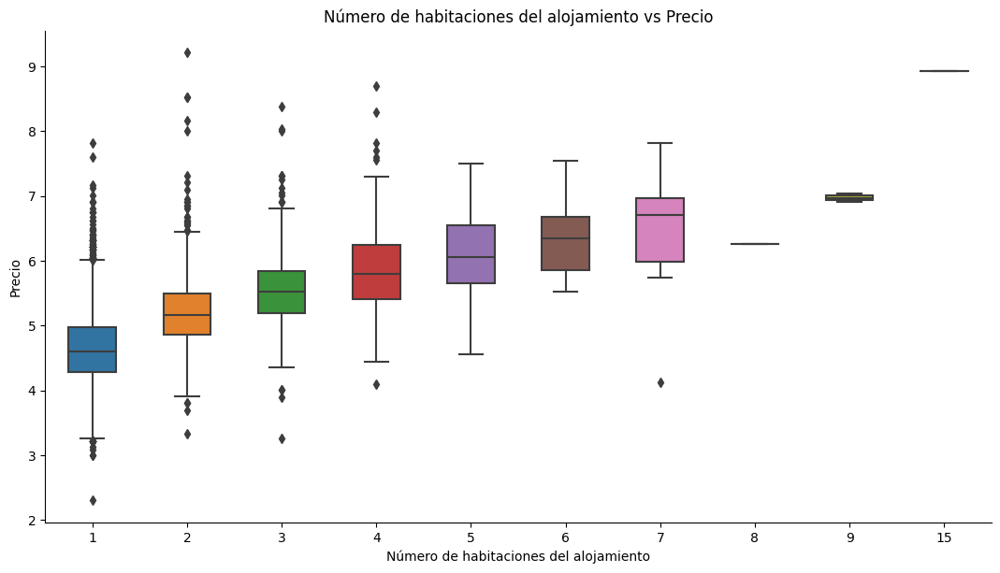

In [84]:
sns.catplot(
    data=alojamientos_gdf, 
    x='bedrooms', y='log_price', kind='box',
    height=6, aspect=1.8, width=0.5
)

plt.xlabel("Número de habitaciones del alojamiento")
plt.ylabel('Precio')
plt.title('Número de habitaciones del alojamiento vs Precio')

# **Análisis de los datos**

## Características del alojamiento

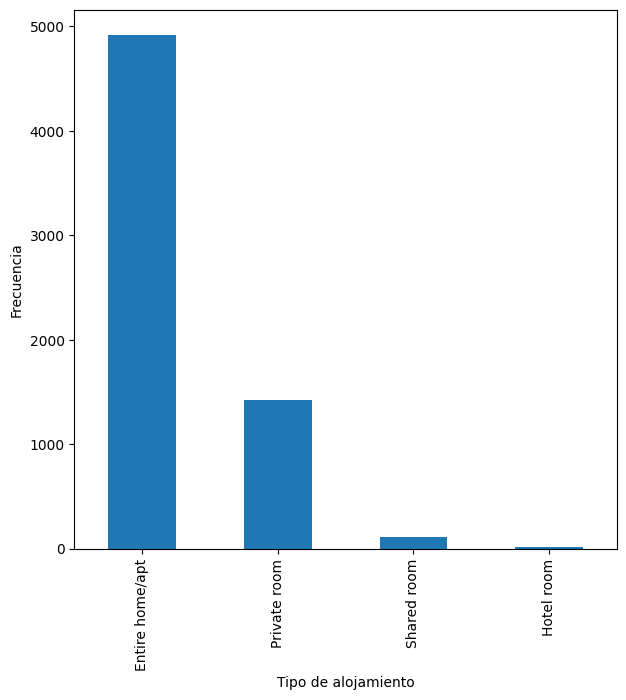

In [85]:
# Gráfico de barras de la frecuencia de los diferentes tipos de alojamiento
alojamientos_gdf['room_type'].value_counts().plot(kind='bar')
plt.xlabel('Tipo de alojamiento')
plt.ylabel('Frecuencia')
plt.show()

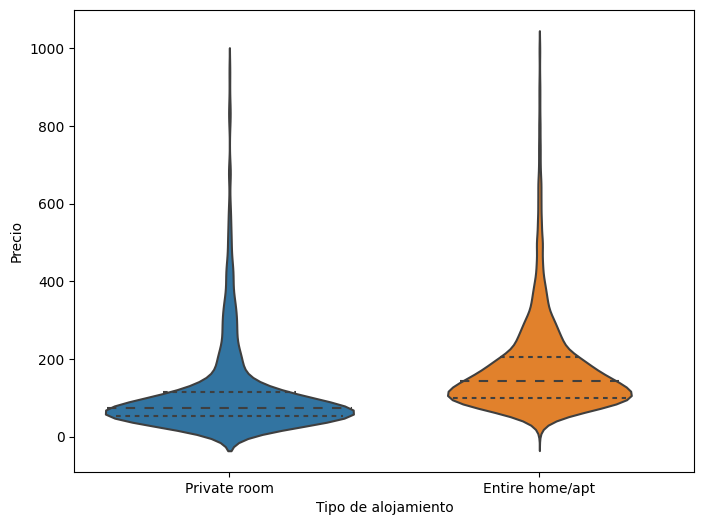

In [86]:
# Gráfico de densidad del precio por tipo de alojamiento
df_density = alojamientos_gdf[['price', 'room_type']].copy()
df_density = df_density[df_density['price'] < 1000]
df_density = df_density[df_density['room_type'].isin(['Entire home/apt', 'Private room'])]
df_density = pd.melt(df_density, id_vars=['room_type'], value_vars=['price'])
plt.figure(figsize=(8,6))
sns.violinplot(data=df_density, x='room_type', y='value', inner='quartile')
plt.xlabel('Tipo de alojamiento')
plt.ylabel('Precio')
plt.show()

**Room Type**

(array([0, 1, 2, 3]),
 [Text(0, 0, 'Entire home/apt'),
  Text(1, 0, 'Private room'),
  Text(2, 0, 'Shared room'),
  Text(3, 0, 'Hotel room')])

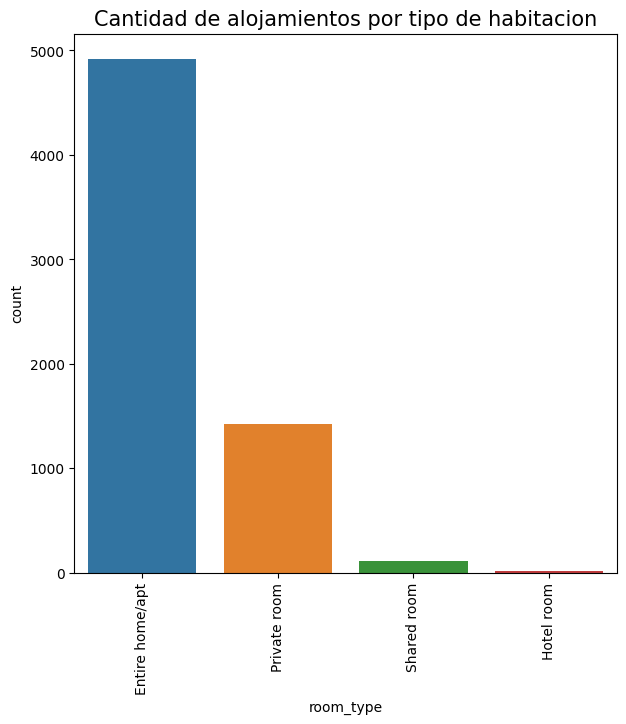

In [87]:
plt.figure(figsize=(7,7))
ax = sns.countplot(data = alojamientos_gdf, x='room_type', order = alojamientos_gdf['room_type'].value_counts().index)
ax.set_title("Cantidad de alojamientos por tipo de habitacion", fontsize=15)
plt.xticks(rotation = 90)

Text(0.5, 1.0, 'Tipo de habitación (room_type)')

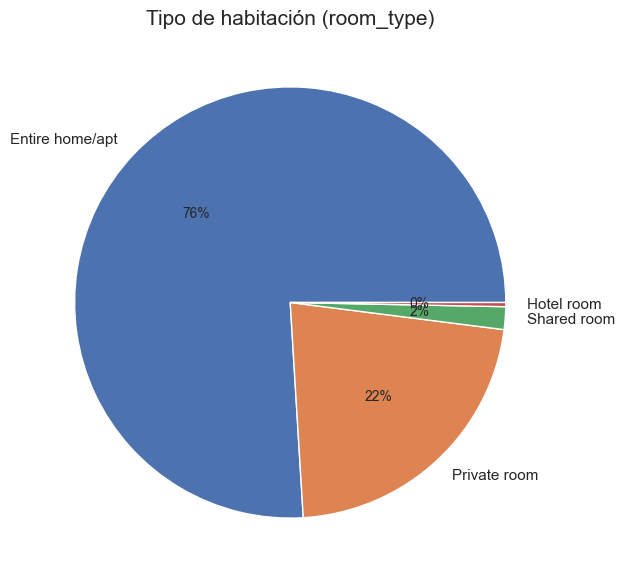

In [88]:
sns.set(rc={'figure.figsize':(7,7)})
plt.rcParams.update({'font.size': 10})
tmp = alojamientos_gdf.groupby(['room_type'], as_index=False)['id'].count().sort_values(by = 'id', ascending=False)
plt.pie(tmp["id"], labels = tmp["room_type"], autopct='%.0f%%') 
plt.title('Tipo de habitación (room_type)', fontsize=15)

In [89]:
tmp = alojamientos_gdf.groupby(['room_type'], as_index=False)['price'].mean().sort_values(by = 'price', ascending=False)
tmp.head(20)

,room_type,price
0,Entire home/apt,197.590844
2,Private room,126.905263
1,Hotel room,90.500000
3,Shared room,51.163636


Text(0.5, 1.0, 'Precio promedio de los distintos tipo de habitación de los alojamientos')

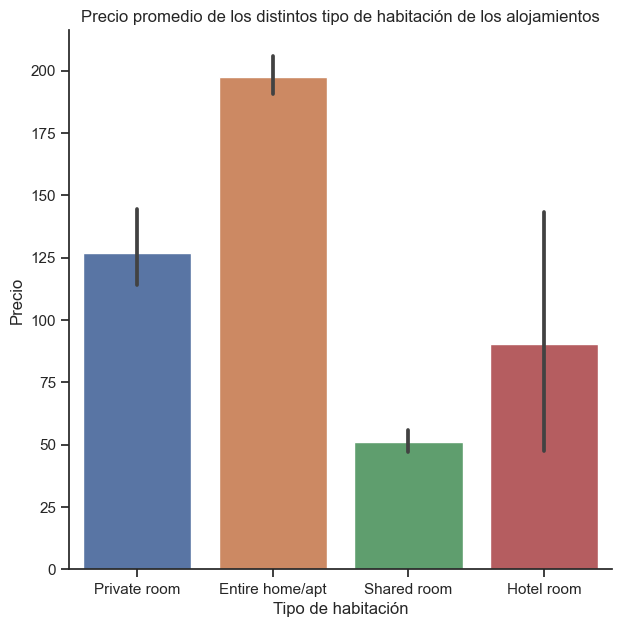

In [90]:
sns.set(rc={'figure.figsize':(7,7)})
custom_params = {"axes.spines.right": False, "axes.spines.top": False}
sns.set_theme(style="ticks", rc=custom_params)
ax = sns.barplot(x='room_type', y='price', data=alojamientos_gdf) #,  palette="muted", orient='h' )
    
plt.xlabel('Tipo de habitación')
plt.ylabel('Precio')
plt.title('Precio promedio de los distintos tipo de habitación de los alojamientos')

**Property Type**

In [91]:
tmp = alojamientos_gdf.groupby(['property_type'], as_index=False)['number_of_reviews'].count().sort_values(by = 'number_of_reviews', ascending=False)
tmp.head(10)

,property_type,number_of_reviews
12,Entire rental unit,2301
9,Entire home,681
26,Private room in home,571
5,Entire condo,545
14,Entire townhouse,499
7,Entire guest suite,473
32,Private room in townhouse,282
13,Entire serviced apartment,259
29,Private room in rental unit,232
36,Room in boutique hotel,112


In [92]:
tmp = alojamientos_gdf.groupby(['property_type'], as_index=False)['id'].count().sort_values(by = 'id', ascending=False)
tmp.head(60)

,property_type,id
12,Entire rental unit,2301
9,Entire home,681
26,Private room in home,571
5,Entire condo,545
14,Entire townhouse,499
7,Entire guest suite,473
32,Private room in townhouse,282
13,Entire serviced apartment,259
29,Private room in rental unit,232
36,Room in boutique hotel,112


In [93]:
tmp = alojamientos_gdf.groupby(['property_type'], as_index=False)['price'].mean().sort_values(by = 'price', ascending=False)
tmp.head(100)

,property_type,price
16,Entire villa,1480.000000
50,Tower,761.000000
30,Private room in resort,575.000000
38,Room in hotel,396.016667
9,Entire home,353.872247
36,Room in boutique hotel,347.741071
39,Room in serviced apartment,289.500000
14,Entire townhouse,278.785571
49,Tiny home,265.000000
11,Entire place,259.833333


(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
        34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50]),
 [Text(0, 0, 'Entire rental unit'),
  Text(1, 0, 'Entire home'),
  Text(2, 0, 'Private room in home'),
  Text(3, 0, 'Entire condo'),
  Text(4, 0, 'Entire townhouse'),
  Text(5, 0, 'Entire guest suite'),
  Text(6, 0, 'Private room in townhouse'),
  Text(7, 0, 'Entire serviced apartment'),
  Text(8, 0, 'Private room in rental unit'),
  Text(9, 0, 'Room in boutique hotel'),
  Text(10, 0, 'Private room in condo'),
  Text(11, 0, 'Entire guesthouse'),
  Text(12, 0, 'Room in hotel'),
  Text(13, 0, 'Shared room in rental unit'),
  Text(14, 0, 'Private room in guest suite'),
  Text(15, 0, 'Entire loft'),
  Text(16, 0, 'Private room in bed and breakfast'),
  Text(17, 0, 'Shared room in townhouse'),
  Text(18, 0, 'Shared room in home'),
  Text(19, 0, 'Shared room in host

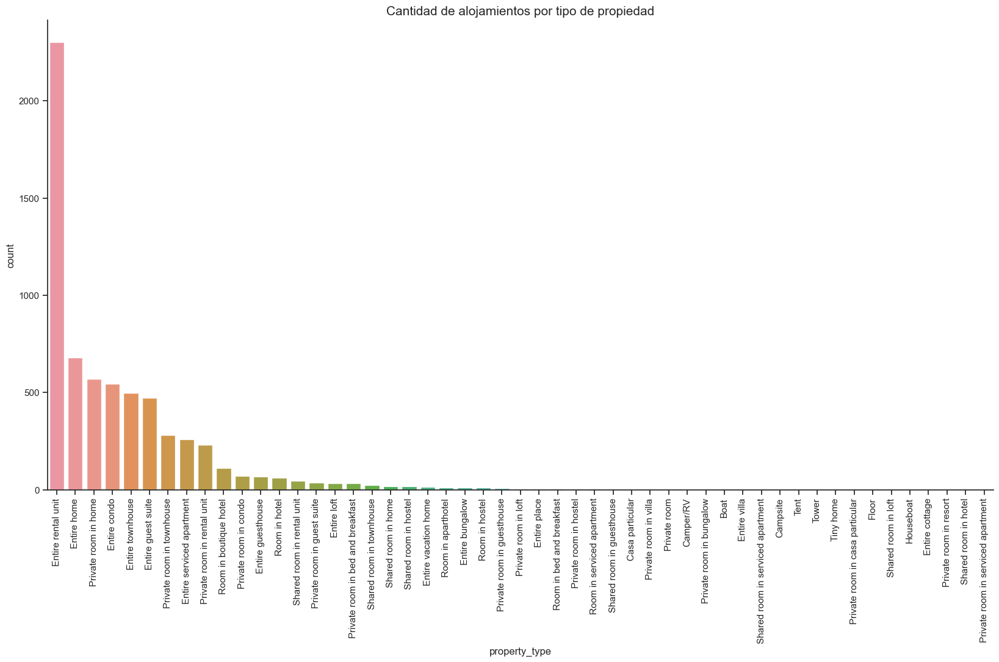

In [94]:
plt.figure(figsize=(20,10))
ax = sns.countplot(data = alojamientos_gdf, x='property_type', order = alojamientos_gdf['property_type'].value_counts().index)
ax.set_title("Cantidad de alojamientos por tipo de propiedad", fontsize=15)
plt.xticks(rotation = 90)

In [95]:
alojamientos_gdf.groupby(['property_type_cluster'], as_index=False).agg(
    cantidad = ("price", "count"),
    precio_promedio = ("price", "mean")
)

,property_type_cluster,cantidad,precio_promedio
0,0,5045,193.973637
1,1,1425,126.905263


**Availability**

In [96]:
alojamientos_gdf.groupby(['has_availability'], as_index=False).agg(
    cantidad = ("price", "count"),
    precio_promedio = ("price", "mean")
)

,has_availability,cantidad,precio_promedio
0,0,449,227.216036
1,1,6021,175.621491


In [97]:
#alojamientos_gdf.groupby(['availability_365'], as_index=False).agg(
#    cantidad = ("price", "count"),
#    precio_promedio = ("price", "mean")
#)

**Otros**

Text(0.5, 1.0, 'bathrooms_quantity vs price')

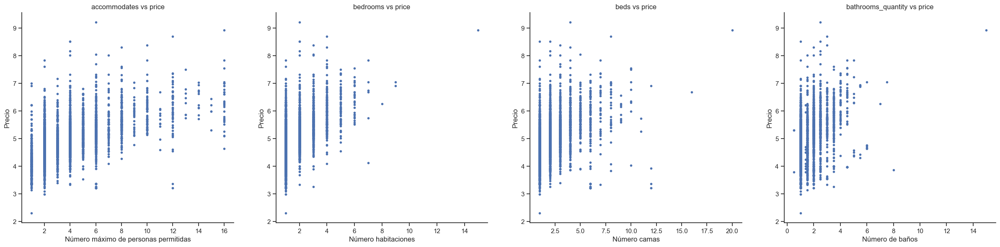

In [98]:
plt.rcParams['figure.figsize'] = [30, 30]

plt.subplot(4, 4, 1)
plt.plot(alojamientos_gdf["accommodates"], alojamientos_gdf["log_price"], marker='.', linestyle='none')
plt.xlabel("Número máximo de personas permitidas")
plt.ylabel('Precio')
plt.title('accommodates vs price')

plt.subplot(4, 4, 2)
plt.plot(alojamientos_gdf["bedrooms"], alojamientos_gdf["log_price"], marker='.', linestyle='none')
plt.xlabel("Número habitaciones")
plt.ylabel('Precio')
plt.title('bedrooms vs price')

plt.subplot(4, 4, 3)
plt.plot(alojamientos_gdf["beds"], alojamientos_gdf["log_price"], marker='.', linestyle='none')
plt.xlabel("Número camas")
plt.ylabel('Precio')
plt.title('beds vs price')

plt.subplot(4, 4, 4)
plt.plot(alojamientos_gdf["bathrooms_quantity"], alojamientos_gdf["log_price"], marker='.', linestyle='none')
plt.xlabel("Número de baños")
plt.ylabel('Precio')
plt.title('bathrooms_quantity vs price')

**instant_bookable**

Análisis de la variable instant_bookable: Indica si el huesped puede automaticamente reservar el alojamiento sin que el host deba veriificar.

Text(0.5, 1.0, 'El alojamiento es reservable inmediatamente')

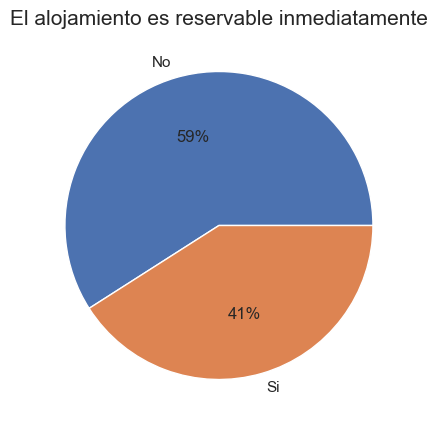

In [99]:
sns.set(rc={'figure.figsize':(5,5)})
tmp = alojamientos_gdf.groupby(['instant_bookable'], as_index=False)['id'].count().sort_values(by = 'id', ascending=False)
tmp['instant_bookable'] = tmp['instant_bookable'].replace(to_replace=[1, 0], value=["Si", "No"])
plt.pie(tmp["id"], labels = tmp["instant_bookable"], autopct='%.0f%%')
plt.title('El alojamiento es reservable inmediatamente', fontsize=15)

In [100]:
alojamientos_gdf.groupby(['instant_bookable'], as_index=False).agg(
    cantidad = ("price", "count"),
    precio_promedio = ("price", "mean")
)

,instant_bookable,cantidad,precio_promedio
0,0,3820,176.076440
1,1,2650,183.707547


## Características de ubicación

Número de alojamientos de Airbnb por barrio en la ciudad de Washington DC

Text(0.5, 1.0, 'Número de alojamientos de Airbnb por barrio en la ciudad de Washington DC')

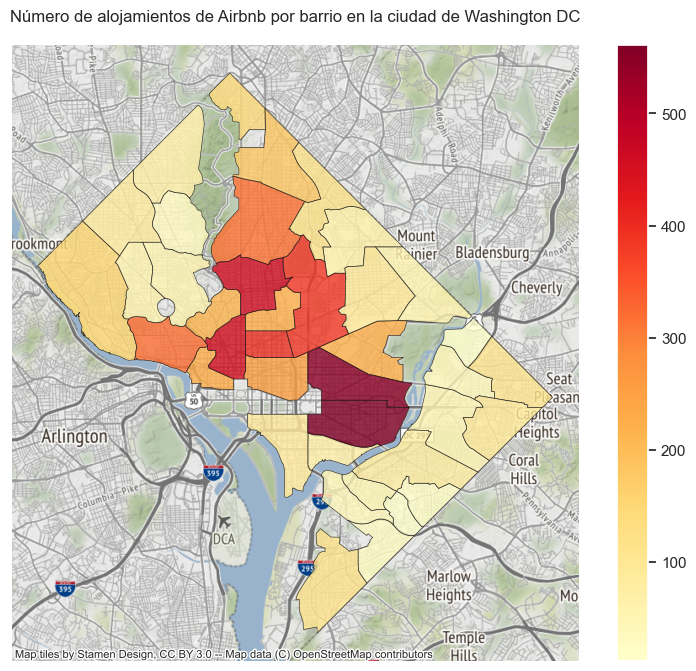

In [101]:
max_alojamientos = vecindarios_airbnb.conteo_alojamientos.max()
tmp_map = vecindarios_airbnb.copy()
tmp_map = tmp_map.to_crs(epsg=3857)
fig, ax = plt.subplots(figsize=(10,8), subplot_kw={'aspect':'equal'})
ax = tmp_map.plot(column='conteo_alojamientos', cmap='YlOrRd', legend=True, ax=ax, alpha=0.8, edgecolor='k',  linewidth=0.5)
ctx.add_basemap(ax, url=ctx.providers.Stamen.TonerLite)
ax.set_axis_off()
plt.title("Número de alojamientos de Airbnb por barrio en la ciudad de Washington DC")

**Barrios**

Text(0.5, 1.0, 'Barrios de la ciudad de Washington DC')

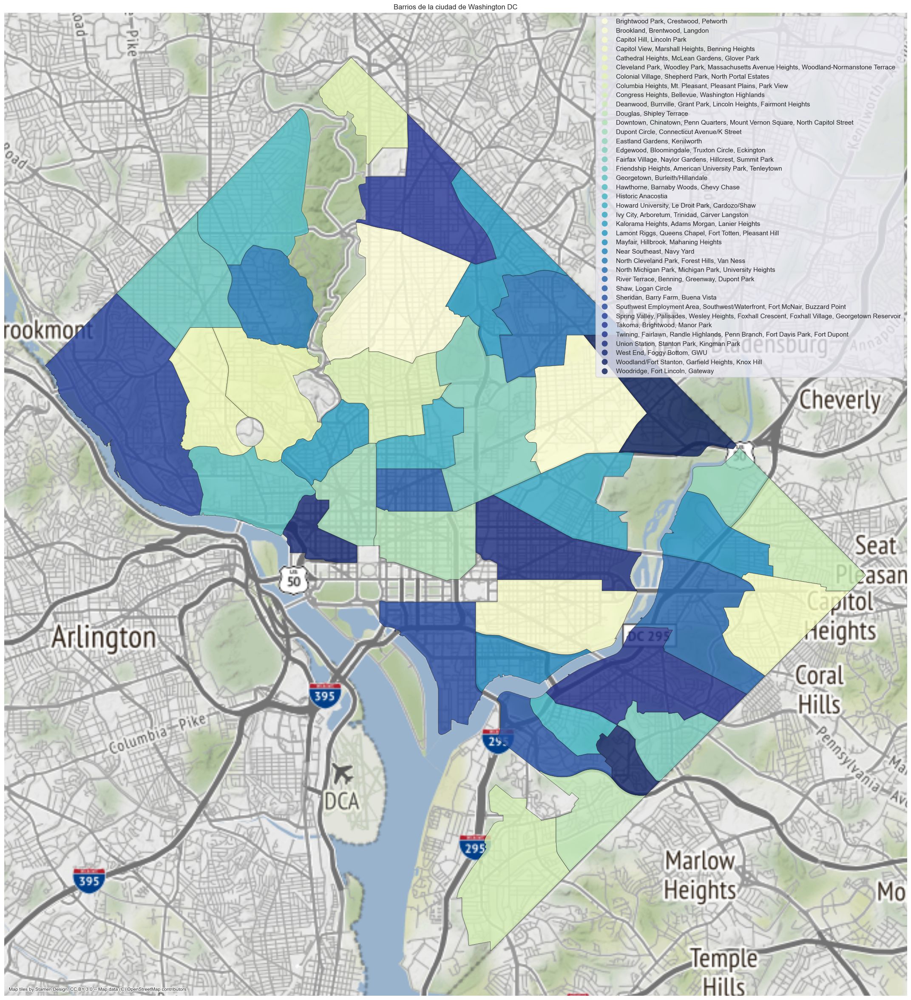

In [102]:
# cmap = 'Greys', 'Purples', 'Blues', 'Greens', 'Oranges', 'Reds', 'YlOrBr', 'YlOrRd', 'OrRd', 'PuRd', 'RdPu', 'BuPu', 'GnBu', 'PuBu', 'YlGnBu', 'PuBuGn', 'BuGn', 'YlGn'

tmp_map = vecindarios_airbnb.copy()
tmp_map = tmp_map.to_crs(epsg=3857)
fig, ax = plt.subplots(figsize=(50,30), subplot_kw={'aspect':'equal'})
ax = tmp_map.plot(column='neighbourhood', cmap='YlGnBu', legend=True, ax=ax, alpha=0.8, edgecolor='k',  linewidth=0.5, categorical=True)
ctx.add_basemap(ax, url=ctx.providers.Stamen.TonerLite)
ax.set_axis_off()
plt.title("Barrios de la ciudad de Washington DC")

Text(0.5, 1.0, 'Promedio de precios de alojamientos de Airbnb por barrio en la ciudad de Washington DC')

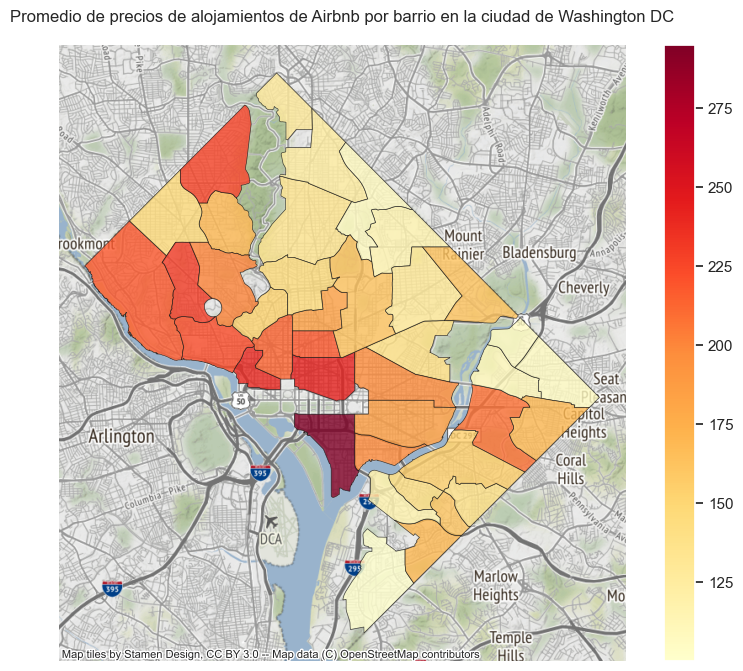

In [103]:
tmp_map = vecindarios_airbnb.copy()
tmp_map = tmp_map.to_crs(epsg=3857)
#legend_kwds={'label': 'FOO', 'shrink': 0.5},
fig, ax = plt.subplots(figsize=(10,8), subplot_kw={'aspect':'equal'})
ax = tmp_map.plot(column='price_mean', cmap='YlOrRd', legend=True, ax=ax, alpha=0.8, edgecolor='k',  linewidth=0.5)
ctx.add_basemap(ax, url=ctx.providers.Stamen.TonerLite)
ax.set_axis_off()
plt.title("Promedio de precios de alojamientos de Airbnb por barrio en la ciudad de Washington DC")

Text(0.5, 1.0, 'Puntaje promedio de alojamientos de Airbnb por barrio en la ciudad de Washington DC')

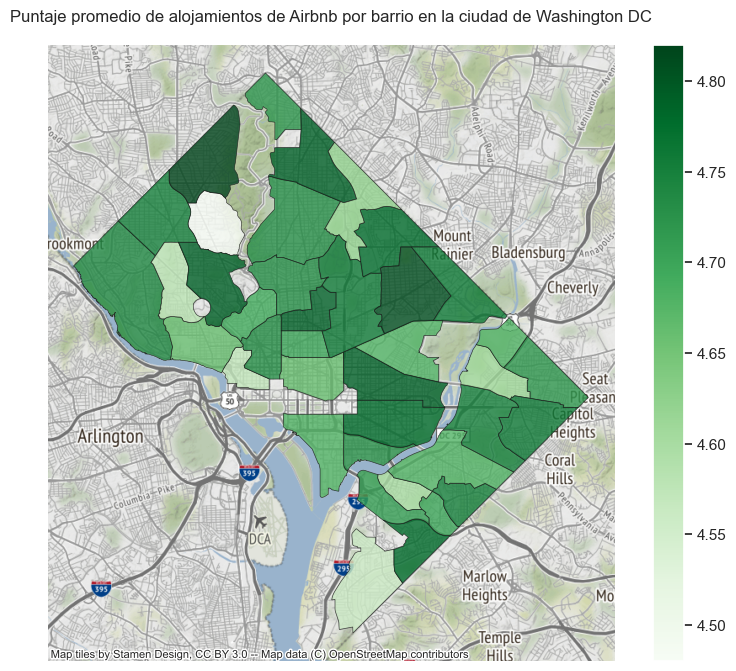

In [104]:
# cmap = 'Greys', 'Purples', 'Blues', 'Greens', 'Oranges', 'Reds', 'YlOrBr', 'YlOrRd', 'OrRd', 'PuRd', 'RdPu', 'BuPu', 'GnBu', 'PuBu', 'YlGnBu', 'PuBuGn', 'BuGn', 'YlGn'
tmp_map = vecindarios_airbnb.copy()
tmp_map = tmp_map.to_crs(epsg=3857)

fig, ax = plt.subplots(figsize=(10,8), subplot_kw={'aspect':'equal'})
ax = tmp_map.plot(column='review_scores_rating_mean', cmap='Greens', legend=True, ax=ax, alpha=0.8, edgecolor='k',  linewidth=0.5)
ctx.add_basemap(ax, url=ctx.providers.Stamen.TonerLite)
ax.set_axis_off()
plt.title("Puntaje promedio de alojamientos de Airbnb por barrio en la ciudad de Washington DC")

In [105]:
tmp = alojamientos_gdf.groupby(['neighbourhood_cleansed','room_type'], as_index=False)['id'].count().sort_values(by = 'neighbourhood_cleansed', ascending=False)
tmp.head(10)

,neighbourhood_cleansed,room_type,id
103,"Woodridge, Fort Lincoln, Gateway",Private room,13
102,"Woodridge, Fort Lincoln, Gateway",Entire home/apt,42
101,"Woodland/Fort Stanton, Garfield Heights, Knox ...",Private room,3
100,"Woodland/Fort Stanton, Garfield Heights, Knox ...",Entire home/apt,9
99,"West End, Foggy Bottom, GWU",Shared room,2
98,"West End, Foggy Bottom, GWU",Private room,14
97,"West End, Foggy Bottom, GWU",Entire home/apt,209
96,"Union Station, Stanton Park, Kingman Park",Shared room,16
95,"Union Station, Stanton Park, Kingman Park",Private room,72
94,"Union Station, Stanton Park, Kingman Park",Entire home/apt,462


<AxesSubplot: title={'center': 'Top 10 de vecindarios con mayor cantidad de alojamientos'}>

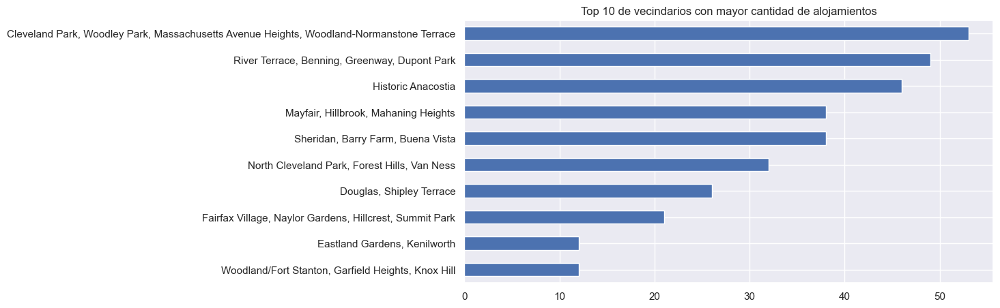

In [106]:
alojamientos_gdf['neighbourhood_cleansed'].value_counts().sort_values().head(10).plot(kind='barh', figsize=(10,5), title="Top 10 de vecindarios con mayor cantidad de alojamientos")

## Características de servicios adicionales

**Amenities**

In [107]:
for amenidad in variables_amenidades:
    tmp_res = alojamientos_gdf.groupby([amenidad], as_index=False).agg(
        cantidad = ("price", "count"),
        precio_promedio = ("price", "mean")
    )
    print(tmp_res)

   has_Breakfast  cantidad  precio_promedio
0              0      6051       179.974054
1              1       419       168.052506
   has_Washer  cantidad  precio_promedio
0           0      3003       166.318348
1           1      3467       190.361408
   has_Dishwasher  cantidad  precio_promedio
0               0      3245       163.036055
1               1      3225       195.468217
   has_Dryer  cantidad  precio_promedio
0          0      3257       170.868284
1          1      3213       187.649860
   has_TV  cantidad  precio_promedio
0       0      3325       172.832782
1       1      3145       185.935771
   has_Freezer  cantidad  precio_promedio
0            0      4562       179.737396
1            1      1908       177.921908
   has_Airconditioning  cantidad  precio_promedio
0                    0      1884       176.057856
1                    1      4586       180.493676
   has_Heating  cantidad  precio_promedio
0            0      1401       183.599572
1            1     

In [108]:
#def definir_color(feature):
#    value = valores_precio.get(feature['properties']['neighbourhood'])
#    return color(value)
#valores_precio = vecindarios_airbnb.set_index('neighbourhood')['Precio_Promedio'].to_dict()
#color = LinearColormap(['yellow','red'], vmin = min(valores_precio.values()), vmax = max(valores_precio.values()))
#fig = folium.Figure(width=800, height=650)
#mapa_precios = folium.Map(location=[38.91545, -77.0305], zoom_start = 12) 
#folium.GeoJson(data = vecindarios_airbnb, name='Washington D.C',
#                tooltip=folium.features.GeoJsonTooltip(fields=['neighbourhood', 'Precio_Promedio'],labels=True,sticky=False), style_function = lambda feature: {
#                  'fillColor': definir_color(feature),'color': 'black','weight': 0.5,'dashArray': '3, 3','fillOpacity':0.7
#                },
#                highlight_function=lambda feature: {'weight': 4, 'fillColor': definir_color(feature), 'fillOpacity': 0.4}).add_to(mapa_precios)
#title_html = """<h3 align="center" style="font-size:16px"><b>Mapa de precios de alojamientos por barrios en la ciudad de Washington D.C</b></h3>"""
#fig.get_root().html.add_child(folium.Element(title_html))                
#fig.add_child(mapa_precios)

In [109]:
# Generate scatter plot
#joint_axes = sns.jointplot(
#    x="longitude", y="latitude", data=alojamientos_gdf, s=0.9
#)
#ctx.add_basemap(
#    joint_axes.ax_joint,
#    crs="EPSG:4326",
#    source=ctx.providers.CartoDB.PositronNoLabels,
#)

In [110]:
#alojamientos_gdf.property_type.value_counts()

## Características de calificación del huésped

**Scores**

In [111]:
tmp = alojamientos_gdf.groupby(['property_type'], as_index=False)['review_scores_rating'].mean().sort_values(by = 'review_scores_rating', ascending=False)
tmp.head(10)

,property_type,review_scores_rating
1,Camper/RV,5.000000
17,Floor,4.960000
18,Houseboat,4.920000
22,Private room in casa particular,4.920000
3,Casa particular,4.907673
8,Entire guesthouse,4.894295
7,Entire guest suite,4.837944
0,Boat,4.830000
19,Private room,4.815347
39,Room in serviced apartment,4.815000


In [112]:
tmp = alojamientos_gdf.groupby(['room_type'], as_index=False)['number_of_reviews'].count().sort_values(by = 'number_of_reviews', ascending=False)
tmp.head()

,room_type,number_of_reviews
0,Entire home/apt,4915
2,Private room,1425
3,Shared room,110
1,Hotel room,20


<AxesSubplot: xlabel='number_of_reviews', ylabel='Count'>

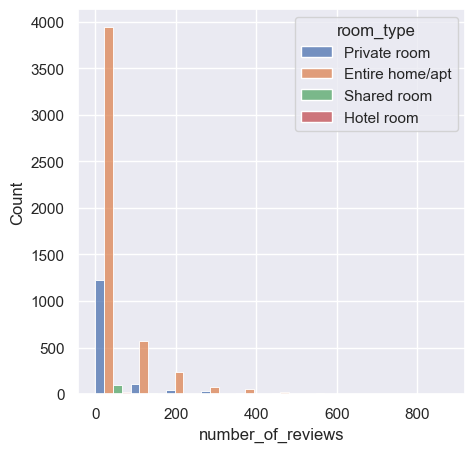

In [113]:
sns.histplot(alojamientos_gdf, x=alojamientos_gdf['number_of_reviews'], bins=10, hue="room_type", multiple="dodge") #, discrete=True)#, bins=20) #, binwidth=1) , element="step"


Text(0.5, 1.0, 'Número de reviews por tipo de habitación')

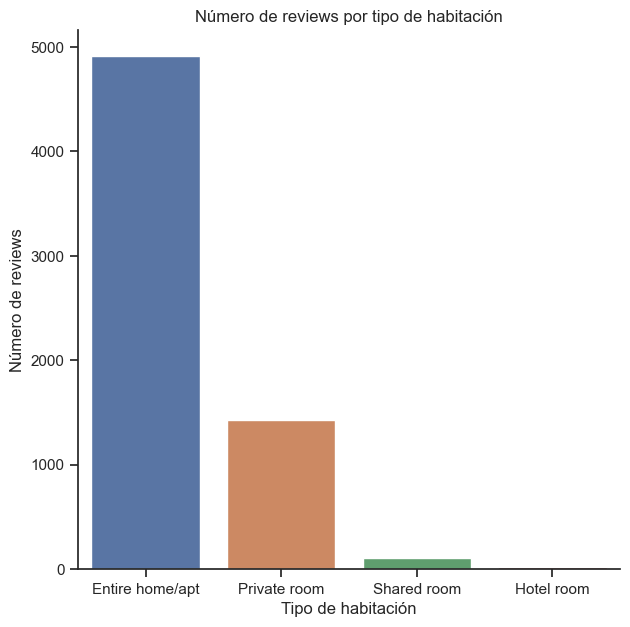

In [114]:
sns.set(rc={'figure.figsize':(7,7)})
custom_params = {"axes.spines.right": False, "axes.spines.top": False}
sns.set_theme(style="ticks", rc=custom_params)
ax = sns.barplot(x='room_type', y='number_of_reviews', data=tmp) 

plt.xlabel('Tipo de habitación')
plt.ylabel('Número de reviews')
plt.title('Número de reviews por tipo de habitación')

In [115]:
tmp = alojamientos_gdf.groupby(['room_type'], as_index=False)['review_scores_rating'].mean().sort_values(by = 'review_scores_rating', ascending=False)
tmp.head()

,room_type,review_scores_rating
0,Entire home/apt,4.741631
2,Private room,4.676985
1,Hotel room,4.562000
3,Shared room,4.517090


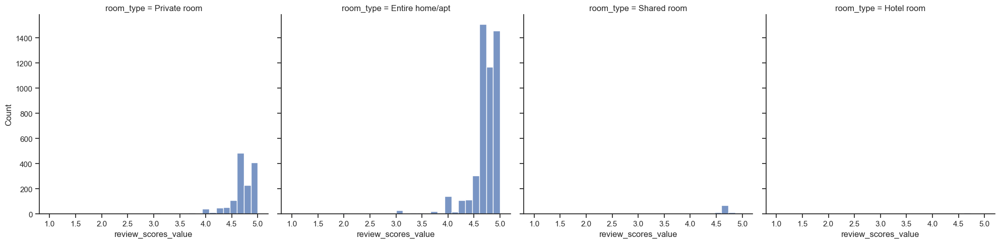

In [116]:
#plt.rcParams['figure.figsize'] = [10, 7]
#sns.histplot(alojamientos_gdf, x=alojamientos_gdf['review_scores_value'], bins=10, hue="room_type", multiple="dodge") #, discrete=True)#, bins=20) #, binwidth=1) , element="step"
#plt.title('Distribución del puntaje de los alojamientos')

sns.displot(alojamientos_gdf, x=alojamientos_gdf['review_scores_value'], bins=30, col="room_type") #, discrete=True)#, bins=20) #, binwidth=1) , element="step"


In [117]:
#plt.figure(figsize=(5,5))
#plt.scatter(x = alojamientos_gdf["availability_365"], y = alojamientos_gdf["log_price"])
#plt.xlabel('availability_365', fontsize=12)
#plt.ylabel('price', fontsize=12)
#plt.title('Precio por disponibilidad 365')

In [118]:
#plt.figure(figsize=(5,5))
#plt.scatter(x = alojamientos_gdf["number_of_reviews"], y = alojamientos_gdf["log_price"])
#plt.xlabel('number_of_reviews', fontsize=12)
#plt.ylabel('price', fontsize=12)
#plt.title('price by number_of_reviews')

## Características del host

**HOST**

Text(0.5, 1.0, 'El host tiene imagen de perfil')

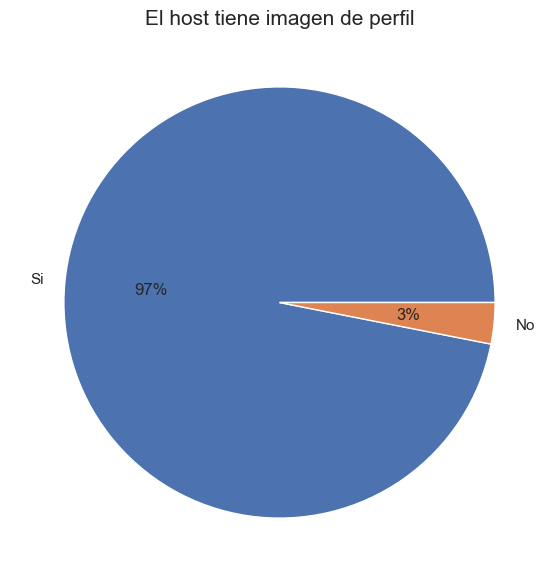

In [119]:
sns.set(rc={'figure.figsize':(7,7)})
tmp = alojamientos_gdf.groupby(['host_has_profile_pic'], as_index=False)['id'].count().sort_values(by = 'id', ascending=False)
tmp['host_has_profile_pic'] = tmp['host_has_profile_pic'].replace(to_replace=[1, 0], value=["Si", "No"])
plt.pie(tmp["id"], labels = tmp["host_has_profile_pic"], autopct='%.0f%%') #, pctdistance=0.5)
plt.title('El host tiene imagen de perfil', fontsize=15)

Text(0.5, 1.0, 'Host es superhost')

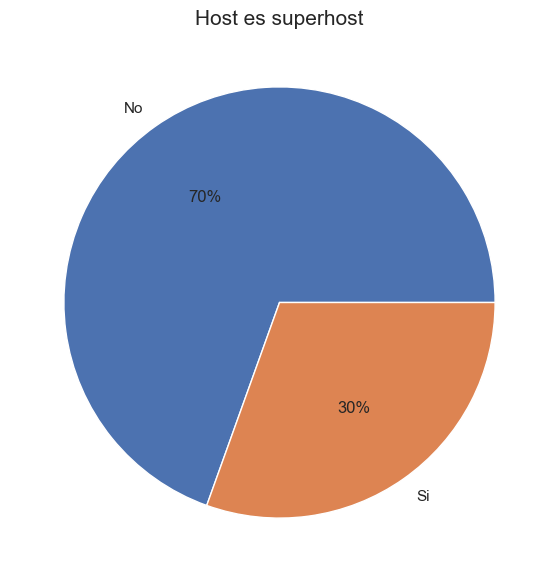

In [120]:
sns.set(rc={'figure.figsize':(7,7)})
tmp = alojamientos_gdf.groupby(['host_is_superhost'], as_index=False)['id'].count().sort_values(by = 'id', ascending=False)
tmp['host_is_superhost'] = tmp['host_is_superhost'].replace(to_replace=[1, 0], value=["Si", "No"])
plt.pie(tmp["id"], labels = tmp["host_is_superhost"], autopct='%.0f%%') #, pctdistance=0.5)
plt.title('Host es superhost', fontsize=15)

Text(0.5, 1.0, 'Identidad de los hosts')

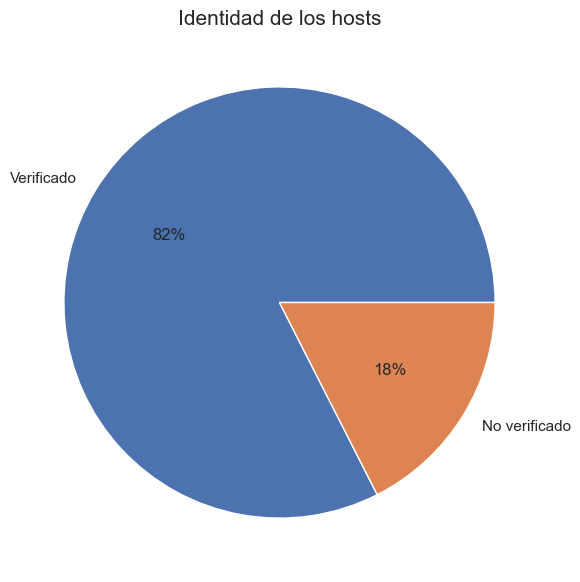

In [121]:
sns.set(rc={'figure.figsize':(7,7)})
tmp = alojamientos_gdf.groupby(['host_identity_verified'], as_index=False)['id'].count().sort_values(by = 'id', ascending=False)
tmp['host_identity_verified'] = tmp['host_identity_verified'].replace(to_replace=[1, 0], value=["Verificado", "No verificado"])
plt.pie(tmp["id"], labels = tmp["host_identity_verified"], autopct='%.0f%%') #, pctdistance=0.5)
plt.title('Identidad de los hosts', fontsize=15)

In [122]:
alojamientos_gdf.groupby(["host_identity_verified"],as_index=False).agg(
    cantidad = ("price", "count"),
     precio_promedio = ("price", "mean")
)

,host_identity_verified,cantidad,precio_promedio
0,0,1133,192.335393
1,1,5337,176.413903


In [123]:
alojamientos_gdf.groupby(["host_is_superhost"],as_index=False).agg(
    cantidad = ("price", "count"),
    precio_promedio = ("price", "mean")
)

,host_is_superhost,cantidad,precio_promedio
0,0,4498,179.969320
1,1,1972,177.451826


# **Selección de características**

Se elegirán aquellas características más relevantes para el modelo.

In [124]:
tmp_caracteristicas = [
# variable dependiente
'log_price',

# características del alojamiento
'shared_room',
'private_room',
'hotel_room',
'entire_home_apt',
'accommodates', 
'bedrooms',  
'beds', 
'bathrooms_quantity', 
'minimum_nights',
'instant_bookable', 
'availability_365', 
'property_type_cluster',

# Características de servicios adicionales
'has_Breakfast',
'has_Washer', 
'has_Dishwasher',
'has_Dryer', 
'has_TV', 
'has_Freezer', 
'has_Airconditioning', 
'has_Heating',
'has_Hotwater', 
'has_Cleaningproducts',
'has_Wifi', 
'has_Hairdryer',
'has_Kitchen', 
'has_Dedicatedworkspace', 
'has_Petsallowed', 
'has_Pool', 
'has_Freestreetparking', 
'has_Freeparkingonpremises',
'has_Smokealarm', 
'has_Securitycamerasonproperty', 

# Características de calificaciones del huesped
'number_of_reviews', 
'review_scores_rating', 
'review_scores_accuracy', 
'review_scores_cleanliness',
'review_scores_checkin', 
'review_scores_communication',
'review_scores_location',
'review_scores_value',

# Caracteristicas del host
'host_response_time_hour',
'host_about', 
'host_is_superhost', 
'host_picture_url', 
'host_verifications', 
'host_has_profile_pic', 
'host_identity_verified',
'host_response_rate', 
'host_acceptance_rate', 
'calculated_host_listings_count',

# Caracteristicas de ubicación
'min_dist_to_bank_ft', 
'min_dist_to_recreation_ft', 
'min_dist_to_metro_bus_stop_ft',
'min_dist_to_points_interest_ft',
'min_dist_to_white_house_ft',
'min_dist_to_lincoln_memorial_ft',
'min_dist_to_national_space_museum_ft',
'min_dist_to_washington_memorial_ft',
'min_dist_to_national_zoo_ft',
'min_dist_to_crime_incident_ft'

]

In [125]:
# VIF dataframe
varis = ['shared_room','private_room','hotel_room',
        #'entire_home_apt',
        'accommodates', 'bedrooms',  'beds', 'bathrooms_quantity', 
        'minimum_nights','instant_bookable', 'availability_365', 
        'property_type_cluster','has_Breakfast','has_Washer', 'has_Dishwasher','has_Dryer', 'has_TV', 'has_Freezer', 'has_Airconditioning', 'has_Heating','has_Hotwater', 'has_Cleaningproducts','has_Wifi', 'has_Hairdryer','has_Kitchen', 'has_Dedicatedworkspace', 'has_Petsallowed', 'has_Pool', 'has_Freestreetparking', 'has_Freeparkingonpremises','has_Smokealarm', 'has_Securitycamerasonproperty', 
        'number_of_reviews', 'review_scores_rating', 'review_scores_accuracy', 'review_scores_cleanliness','review_scores_checkin', 'review_scores_communication','review_scores_location','review_scores_value',
        'host_response_time_hour','host_about', 'host_is_superhost', 'host_picture_url', 'host_verifications', 'host_has_profile_pic', 'host_identity_verified','host_response_rate', 'host_acceptance_rate', 'calculated_host_listings_count',
        'min_dist_to_bank_ft', 'min_dist_to_recreation_ft', 'min_dist_to_metro_bus_stop_ft',
        #'min_dist_to_points_interest_ft',
        'min_dist_to_white_house_ft','min_dist_to_lincoln_memorial_ft',
        'min_dist_to_national_space_museum_ft','min_dist_to_washington_memorial_ft',
        'min_dist_to_national_zoo_ft','min_dist_to_crime_incident_ft']

tmp_1 = MinMaxScaler().fit_transform(alojamientos_gdf[varis])
tmp = pd.DataFrame(tmp_1, index=alojamientos_gdf[varis].index, columns=alojamientos_gdf[varis].columns)

#tmp = alojamientos_gdf[vars]
vif_data = pd.DataFrame()
vif_data["feature"] = tmp.columns
  
# calculating VIF for each feature
vif_data["VIF"] = ["{:f}".format(variance_inflation_factor(tmp.values, i)) for i in range(len(tmp.columns))]
#vif_data["VIF"] = [format(variance_inflation_factor(tmp.values, i), '.8f') for i in range(len(tmp.columns))]
  
print(vif_data) # debajo de 10

                                 feature           VIF
0                            shared_room      1.239878
1                           private_room           inf
2                             hotel_room      1.115093
3                           accommodates     10.217336
4                               bedrooms      6.127434
5                                   beds      5.750047
6                     bathrooms_quantity      5.644836
7                         minimum_nights      1.480787
8                       instant_bookable      2.176912
9                       availability_365      3.506481
10                 property_type_cluster           inf
11                         has_Breakfast      1.162583
12                            has_Washer      8.320298
13                        has_Dishwasher      3.290547
14                             has_Dryer      7.929597
15                                has_TV      2.526833
16                           has_Freezer      3.115654
17        

Feature importance

In [126]:
# Extract features and labels
datos_modelo = alojamientos_gdf[tmp_caracteristicas].copy()
y = datos_modelo['log_price']
X = datos_modelo.drop('log_price', axis = 1)

# Training and Testing Sets
from sklearn.model_selection import train_test_split
train_X, test_X, train_y, test_y = train_test_split(X, y, random_state = 0)

#I convert the train and test dataframe into numpy arrays so that they can be used to train and test the models.

import numpy as np
train_X = np.array(train_X)
test_X = np.array(test_X)
train_y = np.array(train_y)
test_y = np.array(test_y)

In [127]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.pipeline import make_pipeline
#from sklearn.preprocessing import Imputer
from sklearn.impute import SimpleImputer

from sklearn.preprocessing import StandardScaler
imputer = SimpleImputer(missing_values=np.nan, strategy='mean')

# Create the pipeline (imputer + scaler + regressor)
my_pipeline_RF = make_pipeline(imputer, StandardScaler(),
                               RandomForestRegressor(random_state=42))

# Fit the model
my_pipeline_RF.fit(train_X, train_y)

def evaluate_model(model, predict_set, evaluate_set):
    predictions = model.predict(predict_set)
    from sklearn.metrics import median_absolute_error
    print("Median Absolute Error: " + str(round(median_absolute_error(predictions, evaluate_set), 2))) 
    from sklearn.metrics import mean_squared_error
    from math import sqrt
    RMSE = round(sqrt(mean_squared_error(predictions, evaluate_set)), 2)
    print("RMSE: " + str(RMSE)) 

In [128]:
result_RF_test = evaluate_model(my_pipeline_RF, test_X, test_y)
result_RF_test

Median Absolute Error: 0.17
RMSE: 0.39


In [129]:
result_RF_train = evaluate_model(my_pipeline_RF, train_X, train_y)
result_RF_train

Median Absolute Error: 0.07
RMSE: 0.15


In [130]:
# Get numerical feature importances
importances = list(my_pipeline_RF.steps[2][1].feature_importances_)
# List of tuples with variable and importance
feature_list = list(datos_modelo.columns.drop("log_price"))
feature_importances = [(feature, round(importance, 5)) for feature, importance in zip(feature_list, importances)]
# Sort the feature importances by most important first
feature_importances = sorted(feature_importances, key = lambda x: x[1], reverse = True)
# Print out the feature and importances 
#[print('Variable: {:20} Importance: {}'.format(*pair)) for pair in feature_importances[0:22]]
[print('Variable: {:50} Importance: {}'.format(*pair)) for pair in feature_importances]

Variable: bedrooms                                           Importance: 0.27948
Variable: min_dist_to_washington_memorial_ft                 Importance: 0.0951
Variable: bathrooms_quantity                                 Importance: 0.0603
Variable: accommodates                                       Importance: 0.05095
Variable: min_dist_to_lincoln_memorial_ft                    Importance: 0.04559
Variable: entire_home_apt                                    Importance: 0.04511
Variable: availability_365                                   Importance: 0.03136
Variable: minimum_nights                                     Importance: 0.02956
Variable: min_dist_to_national_space_museum_ft               Importance: 0.02548
Variable: min_dist_to_white_house_ft                         Importance: 0.02389
Variable: min_dist_to_bank_ft                                Importance: 0.02357
Variable: calculated_host_listings_count                     Importance: 0.02275
Variable: min_dist_to_national

[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None]

In [131]:
# List of features sorted from most to least important
sorted_importances = [importance[1] for importance in feature_importances]

# Cumulative importances
cumulative_importances = sum(sorted_importances)

print(cumulative_importances)

1.00003


# **Modelos de regresión**

Normalización de los datos

In [132]:
tmp_mms_alojamientos_gdf = MinMaxScaler().fit_transform(alojamientos_gdf[tmp_caracteristicas])
MMS_alojamientos_gdf = pd.DataFrame(tmp_mms_alojamientos_gdf, index=alojamientos_gdf[tmp_caracteristicas].index, columns=alojamientos_gdf[tmp_caracteristicas].columns)

**Regresión OLS**

In [133]:
reg_exp = f"log_price ~ {' + '.join(MMS_alojamientos_gdf.columns[1:])}"
model = smf.ols(formula=reg_exp, data=MMS_alojamientos_gdf)
results_formula = model.fit()

Se agregarán los resultados de la regresión OLS a una estructura para su posterior análisis.

In [134]:
RESULTADOS = pd.DataFrame(columns=['caracteristica'])
for caracteristica in tmp_caracteristicas:
    if caracteristica != 'log_price':
        RESULTADOS = pd.concat([pd.DataFrame([[caracteristica]], columns=RESULTADOS.columns), RESULTADOS], ignore_index=True)
RESULTADOS.set_index("caracteristica", inplace=True)

for caracteristica in tmp_caracteristicas:
    if caracteristica != 'log_price':
        RESULTADOS.loc[caracteristica, ["intercept_OLS"] ] = round(results_formula.params["Intercept"], 4)
        RESULTADOS.loc[caracteristica, ["coeficiente_OLS"] ] = round(results_formula.params[caracteristica], 4)
        RESULTADOS.loc[caracteristica, ["pvalue_OLS"] ] = round(results_formula.pvalues[caracteristica], 4)
        RESULTADOS.loc[caracteristica, ["lower_OLS"] ] = round(results_formula.conf_int().loc[caracteristica][0], 4)
        RESULTADOS.loc[caracteristica, ["upper_OLS"] ] = round(results_formula.conf_int().loc[caracteristica][1], 4)

**Regresión Cualtilica**

Se agregarán los resultados de la regresión cuantílica a una estructura para su posterior análisis.

In [135]:
quantiles = [0.10, 0.25, 0.50, 0.75, 0.90]
reg_exp = f"log_price ~ {' + '.join(MMS_alojamientos_gdf.columns[1:])}"

for q in quantiles:
    quantile_model = smf.quantreg(formula=reg_exp, data=MMS_alojamientos_gdf).fit(q=q)
    for caracteristica in tmp_caracteristicas:
        if caracteristica != 'log_price':
            RESULTADOS.loc[caracteristica, ["coeficiente_"+str(q)] ] = round(quantile_model.params[caracteristica], 4)
            RESULTADOS.loc[caracteristica, ["intercept_"+str(q)] ] = round(quantile_model.params["Intercept"], 4)
            RESULTADOS.loc[caracteristica, ["lower_"+str(q)] ] = round(quantile_model.conf_int().loc[caracteristica][0], 4)
            RESULTADOS.loc[caracteristica, ["upper_"+str(q)] ] = round(quantile_model.conf_int().loc[caracteristica][1], 4)
            RESULTADOS.loc[caracteristica, ["pvalue_"+str(q)] ] = round(quantile_model.pvalues[caracteristica], 4)

Gráficas de la regresión cuantílica

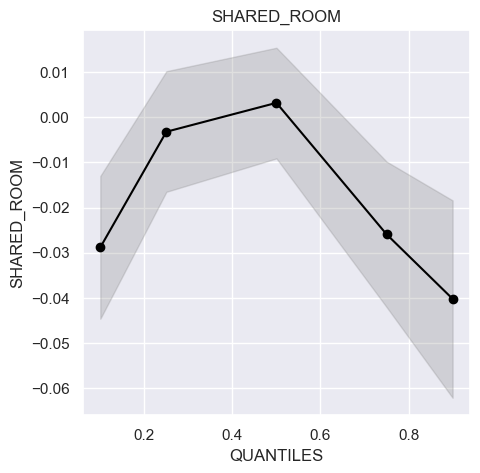

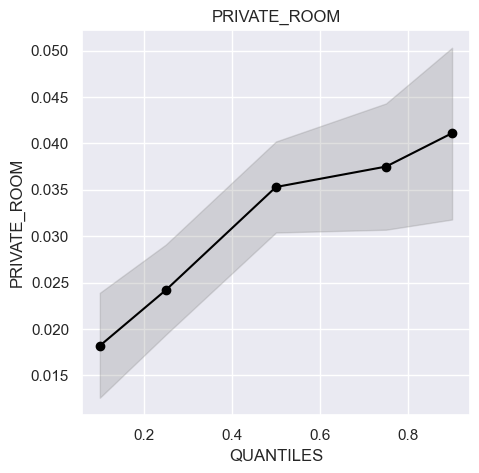

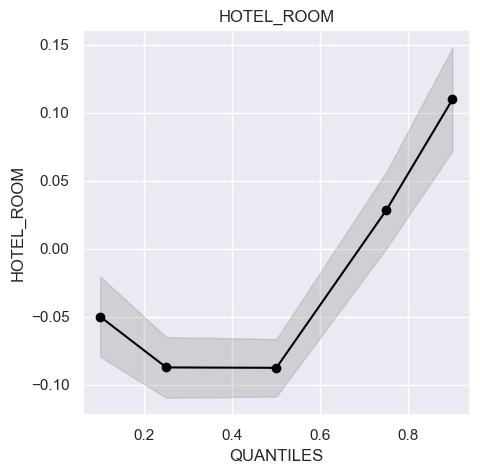

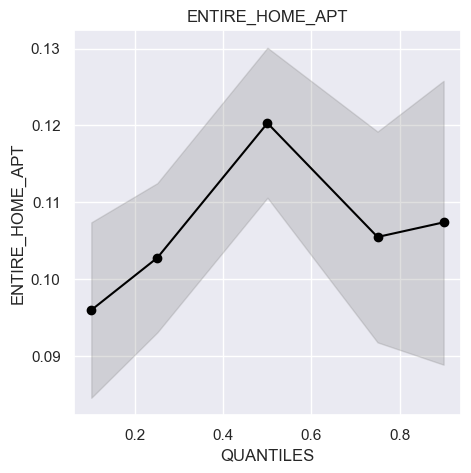

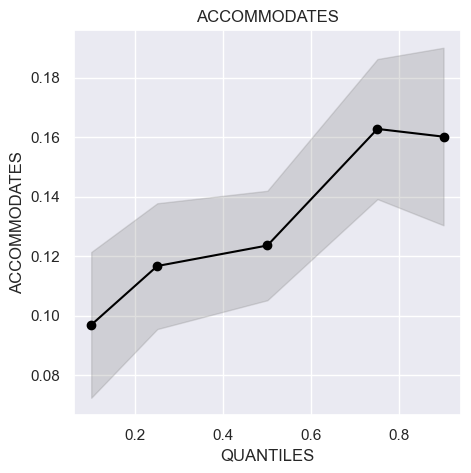

...

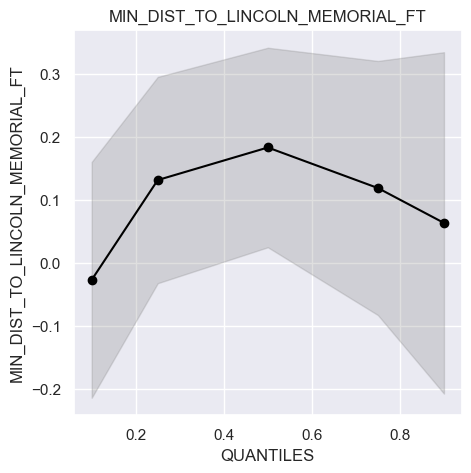

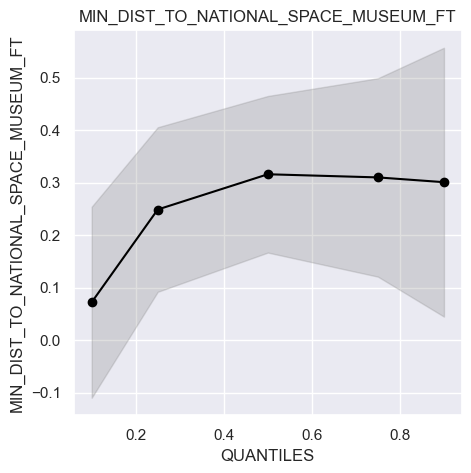

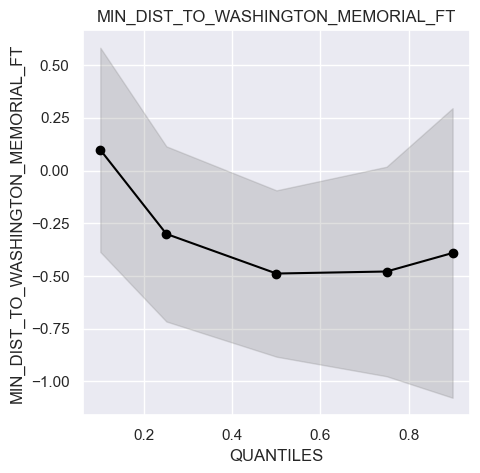

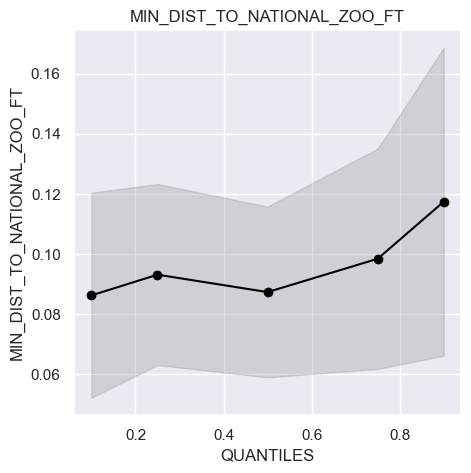

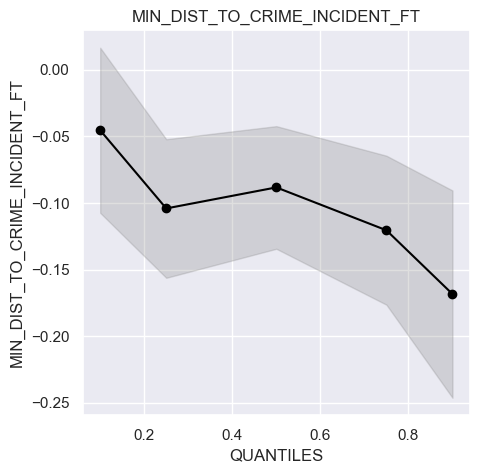

In [136]:
def graficar_resultado(p_caracteristica):
    NUEVO_DF = pd.DataFrame(columns=['q', 'intercept', 'coefb', 'lowerb', 'upperb'])
    NUEVO_DF.set_index("q", inplace=True)

    i = 1
    for q in quantiles:
        # QR
        NUEVO_DF.loc[q, ["quantile_"]] = q
        NUEVO_DF.loc[q, ["coefb"]] = RESULTADOS.loc[p_caracteristica, ["coeficiente_"+str(q)]].values[0]
        NUEVO_DF.loc[q, ["intercept"]] = RESULTADOS.loc[p_caracteristica, ["intercept_"+str(q)]].values[0]
        NUEVO_DF.loc[q, ["lowerb"]] = RESULTADOS.loc[p_caracteristica, ["lower_"+str(q)]].values[0]
        NUEVO_DF.loc[q, ["upperb"]] = RESULTADOS.loc[p_caracteristica, ["upper_"+str(q)]].values[0]

        # OLS
        #NUEVO_DF.loc[q, ["coefOLS"]] = RESULTADOS.loc[p_caracteristica, ["coeficiente_OLS"]].values[0]
        #NUEVO_DF.loc[q, ["lowerOLS"]] = RESULTADOS.loc[p_caracteristica, ["lower_OLS"]].values[0]
        #NUEVO_DF.loc[q, ["upperOLS"]] = RESULTADOS.loc[p_caracteristica, ["upper_OLS"]].values[0]

    NUEVO_DF = NUEVO_DF.reset_index(drop=True)
    NUEVO_DF["coefb"] = NUEVO_DF["coefb"].astype(float)
    NUEVO_DF["intercept"] = NUEVO_DF["intercept"].astype(float)
    NUEVO_DF["lowerb"] = NUEVO_DF["lowerb"].astype(float)
    NUEVO_DF["upperb"] = NUEVO_DF["upperb"].astype(float)
    #NUEVO_DF["coefOLS"] = NUEVO_DF["coefOLS"].astype(float)
    #NUEVO_DF["lowerOLS"] = NUEVO_DF["lowerOLS"].astype(float)
    #NUEVO_DF["upperOLS"] = NUEVO_DF["upperOLS"].astype(float)

    fig, ax = plt.subplots(figsize=(5,5))
    ax.plot(NUEVO_DF.quantile_, NUEVO_DF.coefb, color="black", label="Quantile Reg.", marker='o')
    ax.plot(NUEVO_DF.quantile_, NUEVO_DF.upperb, linestyle="none", color="black")
    ax.plot(NUEVO_DF.quantile_, NUEVO_DF.lowerb, linestyle="none", color="black") #dotted
    ax.fill_between(NUEVO_DF.quantile_, NUEVO_DF.upperb, NUEVO_DF.lowerb, color="gray", alpha=0.25)

    #ax.plot(NUEVO_DF.quantile_, NUEVO_DF.coefOLS, color="red")
    #ax.plot(NUEVO_DF.quantile_, NUEVO_DF.lowerOLS, linestyle="dotted", color="red")
    #ax.plot(NUEVO_DF.quantile_, NUEVO_DF.upperOLS, linestyle="dotted", color="red") 

    plt.ylabel(p_caracteristica.upper())
    plt.xlabel("QUANTILES")
    plt.title(p_caracteristica.upper())
    plt.show()
    i=i+1

for caracteristica in tmp_caracteristicas:
    if caracteristica != 'log_price':
        graficar_resultado(caracteristica)
        

# **Análisis de los resultados de los modelos de regresión**

In [137]:
#RESULTADOS.head()

In [138]:
RESULTADOS[["coeficiente_OLS", "coeficiente_0.1","coeficiente_0.25","coeficiente_0.5","coeficiente_0.75","coeficiente_0.9","pvalue_OLS", "pvalue_0.1", "pvalue_0.25", "pvalue_0.5", "pvalue_0.75", "pvalue_0.9"]].head(100)

,coeficiente_OLS,coeficiente_0.1,coeficiente_0.25,coeficiente_0.5,coeficiente_0.75,coeficiente_0.9,pvalue_OLS,pvalue_0.1,pvalue_0.25,pvalue_0.5,pvalue_0.75,pvalue_0.9
caracteristica,,,,,,,,,,,,
min_dist_to_crime_incident_ft,-1.744000e-01,-0.0454,-0.1041,-0.0883,-0.1205,-0.1684,0.0000,0.1511,0.0001,0.0002,0.0000,0.0000
min_dist_to_national_zoo_ft,1.076000e-01,0.0862,0.0931,0.0873,0.0984,0.1174,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
min_dist_to_washington_memorial_ft,-2.684000e-01,0.0982,-0.3007,-0.4886,-0.4790,-0.3911,0.2629,0.6911,0.1560,0.0152,0.0589,0.2643
min_dist_to_national_space_museum_ft,2.474000e-01,0.0722,0.2490,0.3162,0.3102,0.3011,0.0064,0.4369,0.0019,0.0000,0.0013,0.0213
min_dist_to_lincoln_memorial_ft,8.040000e-02,-0.0267,0.1318,0.1835,0.1191,0.0637,0.4036,0.7802,0.1147,0.0232,0.2471,0.6448
min_dist_to_white_house_ft,-2.123000e-01,-0.2883,-0.2073,-0.1247,-0.0803,-0.1198,0.0157,0.0015,0.0082,0.0908,0.3896,0.3703
min_dist_to_points_interest_ft,1.696000e-01,0.0687,0.1177,0.0874,0.1212,0.1819,0.0000,0.0246,0.0000,0.0002,0.0000,0.0000
min_dist_to_metro_bus_stop_ft,2.840000e-02,-0.0023,-0.0133,0.0060,0.0353,0.0474,0.0221,0.8502,0.2154,0.5650,0.0107,0.0104
min_dist_to_recreation_ft,3.820000e-02,0.0047,0.0083,0.0325,0.0505,0.0451,0.0003,0.6620,0.3823,0.0003,0.0000,0.0054


In [139]:
#test = RESULTADOS.copy()
#test = test.reset_index(drop=False)
#test[test['caracteristica'] == 'property_type_pca'][['caracteristica', "coeficiente_OLS", "coeficiente_0.1","coeficiente_0.25","coeficiente_0.5","coeficiente_0.75","coeficiente_0.9", "pvalue_OLS", "pvalue_0.1", "pvalue_0.25", "pvalue_0.5", "pvalue_0.75", "pvalue_0.9"]].head()